# Indywidualny Projekt Badawczy: Sprawdzenie relacji między wyszukiwaniem fraz, a statystykami Covid-19
## Marta Kacperska 

---
### Linki do zbiorów danych

* Dane o globalnych przypadkach zachorowań na COVID-19 oraz zgonach WHO - https://data.humdata.org/dataset/coronavirus-covid-19-cases-and-deaths
* Dane o szczepieniach na COVID-19 - https://data.humdata.org/m/dataset/covid-19-vaccinations
* Dane o testach na COVID-19 w Europie - https://www.ecdc.europa.eu/en/publications-data/covid-19-testing
* Zunifikowane dane o popularności wyszukiwań fraz: covid, quarantine, covid testing, respiratory disease, vaccination - https://trends.google.com/trends/explore?date=2019-12-01%202024-01-14&q=covid,quarantine,vaccination,respiratory%20disease,covid%20testing&hl=pl
* Zunifikowane dane o popularności wyszukiwań fraz: covid, pneumonia, asthma, lung cancer, cystic fibrosis - https://trends.google.com/trends/explore?date=2019-12-01%202024-01-14&q=covid,pneumonia,asthma,lung%20cancer,cystic%20fibrosis&hl=pl
* Dane o popularności wyszukiwań frazy covid - https://trends.google.com/trends/explore?date=2019-12-01%202024-01-14&q=covid&hl=pl
* Dane o popularności wyszukiwań frazy quarantine - https://trends.google.com/trends/explore?date=2019-12-01%202024-01-14&q=quarantine&hl=pl
* Dane o popularności wyszukiwań frazy respiratory disease - https://trends.google.com/trends/explore?date=2019-12-01%202024-01-14&q=respiratory%20disease&hl=pl
* Dane o popularności wyszukiwań frazy covid testing - https://trends.google.com/trends/explore?date=2019-12-01%202024-01-14&q=covid%20testing&hl=pl
* Dane o popularności wyszukiwań frazy vaccination - https://trends.google.com/trends/explore?date=2019-12-01%202024-01-14&q=vaccination&hl=pl
* Dane o popularności wyszukiwań frazy pneumonia - https://trends.google.com/trends/explore?date=2019-12-01%202024-01-14&q=pneumonia&hl=pl
* Dane o popularności wyszukiwań frazy asthma - https://trends.google.com/trends/explore?date=2019-12-01%202024-01-14&q=asthma&hl=pl
* Dane o popularności wyszukiwań frazy lung cancer - https://trends.google.com/trends/explore?date=2019-12-01%202024-01-14&q=lung%20cancer&hl=pl
* Dane o popularności wyszukiwań frazy cystic fibosis - https://trends.google.com/trends/explore?date=2019-12-01%202024-01-14&q=cystic%20fibrosis&hl=pl
---
## Analiza danych
  
Robimy importy

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

Wczytujemy ramkę z danymi o wyszukiwaniach (na podstawie danych o popularności wyszukiwań fraz)

In [2]:
trends = pd.read_csv("data/cleanData/allGoogleTrends.csv", index_col=0)
trends.index = pd.to_datetime(trends.index)
trends.head(10)

,covid_unified,vaccine_unified,respiratory_disease_unified,covid_testing_unified,quarantine_unified,pneumonia_unified,asthma_unified,lungCancer_unified,cysticFibrosis_unified,vaccine_solo,respiratory_disease_solo,covid_testing_solo,quarantine_solo,pneumonia_solo,asthma_solo,lungCancer_solo,cysticFibrosis_solo
week,,,,,,,,,,,,,,,,,
2019-11-25,0.0,1.0,0.5,0.5,0.5,1.0,0.5,0.5,0.5,3,21,0.5,1,37,30,49,67
2019-12-02,0.5,1.0,0.5,0.5,0.5,1.0,0.5,0.5,0.5,3,20,0.5,1,37,28,48,73
2019-12-09,0.5,1.0,0.5,0.0,0.5,1.0,0.5,0.5,0.5,3,19,0.0,1,39,30,45,65
2019-12-16,0.5,0.5,0.5,0.5,0.5,1.0,0.5,0.5,0.5,2,11,0.0,1,51,26,42,51
2019-12-23,0.0,1.0,0.5,0.0,0.5,1.0,0.5,0.5,0.5,3,12,0.0,1,48,29,44,65
2019-12-30,0.0,1.0,0.5,0.0,0.5,1.0,0.5,0.5,0.5,3,21,0.5,1,49,29,46,60
2020-01-06,0.5,1.0,0.5,0.0,0.5,1.0,0.5,0.5,0.5,3,21,0.5,1,42,31,49,63
2020-01-13,0.5,1.0,0.5,0.0,0.5,1.0,0.5,0.5,0.5,3,24,0.0,2,53,29,49,65
2020-01-20,0.5,1.0,0.5,0.0,0.5,1.0,0.5,0.5,0.5,4,30,0.0,4,57,32,52,67


Poszczególne atrybuty ramki "trends":
* covid_unified	- liczba wyszukiwań frazy "covid" znormalizowana do 0-100 (wartość 100 jest przyjmowana w czasie gdy liczba wyszukiwań danej frazy była największa na przestrzeni zadanego okresu)
* vaccine_unified - liczba wyszukiwań frazy "vaccine" zrelatywizowana do liczby wyszukiwań frazy "covid"
* respiratory_disease_unified - liczba wyszukiwań frazy "respiratory disease" zrelatywizowana do liczby wyszukiwań frazy "covid"
* covid_testing_unified	- liczba wyszukiwań frazy "covid testing" zrelatywizowana do liczby wyszukiwań frazy "covid"
* quarantine_unified - liczba wyszukiwań frazy "quarantine" zrelatywizowana do liczby wyszukiwań frazy "covid"
* pneumonia_unified - liczba wyszukiwań frazy "pneumonia" zrelatywizowana do liczby wyszukiwań frazy "covid"
* asthma_unified - liczba wyszukiwań frazy "asthma" zrelatywizowana do liczby wyszukiwań frazy "covid"
* lungCancer_unified - liczba wyszukiwań frazy "lung cancer" zrelatywizowana do liczby wyszukiwań frazy "covid"
* cysticFibrosis_unified - liczba wyszukiwań frazy "cystic fibrosis" zrelatywizowana do liczby wyszukiwań frazy "covid"
* vaccine_solo - liczba wyszukiwań frazy "vaccine" znormalizowana do 0-100
* respiratory_disease_solo - liczba wyszukiwań frazy "respiratory disease" znormalizowana do 0-100	
* covid_testing_solo - liczba wyszukiwań frazy "covid testing" znormalizowana do 0-100
* quarantine_solo - liczba wyszukiwań frazy "quarantine" znormalizowana do 0-100
* pneumonia_solo - liczba wyszukiwań frazy "pneumonia" znormalizowana do 0-100
* asthma_solo - liczba wyszukiwań frazy "asthma" znormalizowana do 0-100
* lungCancer_solo - liczba wyszukiwań frazy "lung cancer" znormalizowana do 0-100
* cysticFibrosis_solo - liczba wyszukiwań frazy "cystic fibrosis" znormalizowana do 0-100


Wczytujemy ramkę z danymi o przypadkach Covid wraz ze szczepionkami

In [3]:
globalCasesAndVaccinations = pd.read_csv("data/cleanData/covidCasesWithVaccinations.csv", index_col=0)
globalCasesAndVaccinations["date"] = pd.to_datetime(globalCasesAndVaccinations["date"]) 
globalCasesAndVaccinations.head(10)

,date,Country,Country_code,iso_code,WHO_region,New_cases,Cumulative_cases,New_deaths,Cumulative_deaths,totalVaccinations,weeklyVaccinations
0,2021-02-22,Afghanistan,AF,AFG,EMRO,110,55714,11,2443,8200.0,1367.0
1,2021-03-15,Afghanistan,AF,AFG,EMRO,118,56103,6,2463,54000.0,2862.0
2,2021-04-05,Afghanistan,AF,AFG,EMRO,484,57160,24,2521,120000.0,3000.0
3,2021-04-19,Afghanistan,AF,AFG,EMRO,1050,58843,43,2582,240000.0,8000.0
4,2021-05-10,Afghanistan,AF,AFG,EMRO,1642,63484,56,2742,504502.0,13921.0
5,2021-05-17,Afghanistan,AF,AFG,EMRO,2244,65728,60,2802,547901.0,4822.0
6,2021-05-24,Afghanistan,AF,AFG,EMRO,5033,70761,117,2919,600152.0,23693.0
7,2021-05-31,Afghanistan,AF,AFG,EMRO,8463,79224,226,3145,630305.0,10404.0
8,2021-06-07,Afghanistan,AF,AFG,EMRO,10637,89861,382,3527,641295.0,3388.0
9,2021-06-14,Afghanistan,AF,AFG,EMRO,12045,101906,595,4122,662003.0,3272.0


Poszczególne atrybuty ramki "globalCasesAndVaccinations":
* date - data przeprowadzenia pomiaru
* Country - kraj, w którym przeprowadzono pomiar
* Country_code - kod kraju
* iso_code - kod iso kraju
* WHO_region - region WHO
* New_cases - nowe przypadki Covid w danej dacie
* Cumulative_cases - łączna liczba przypadków covid licząc od pierwszego dnia pomiarów
* New_deaths - liczba nowych przypadków zgonów w danej dacie
* Cumulative_deaths - łączna liczba przypadków zgonów licząc od pierwszego dnia pomiarów
* totalVaccinations - łączna liczba szczepień licząc od pierwszego dnia pomiarów
* weeklyVaccinations - liczba szczepień w danym tygodniu

Wczytujemy dane o przypadkach covidu w Europie oraz o wykonanych testach

In [4]:
europeCasesAndTesting = pd.read_csv("data/cleanData/europeCasesAndTesting.csv", index_col=0)
europeCasesAndTesting["date"] = pd.to_datetime(europeCasesAndTesting["date"])
europeCasesAndTesting.head(10)

,date,Country,Country_code,WHO_region,New_cases,Cumulative_cases,New_deaths,Cumulative_deaths,new_cases,tests_done,population,testing_rate,positivity_rate
0,2020-01-06,Austria,AT,EURO,0,0,0,0,0.0,0.0,8978929,0.0,0.0
1,2020-01-13,Austria,AT,EURO,0,0,0,0,0.0,0.0,8978929,0.0,0.0
2,2020-01-20,Austria,AT,EURO,0,0,0,0,0.0,0.0,8978929,0.0,0.0
3,2020-01-27,Austria,AT,EURO,0,0,0,0,0.0,0.0,8978929,0.0,0.0
4,2020-02-03,Austria,AT,EURO,0,0,0,0,0.0,0.0,8978929,0.0,0.0
5,2020-02-10,Austria,AT,EURO,0,0,0,0,0.0,0.0,8978929,0.0,0.0
6,2020-02-17,Austria,AT,EURO,0,0,0,0,0.0,0.0,8978929,0.0,0.0
7,2020-02-24,Austria,AT,EURO,7,7,0,0,0.0,0.0,8978929,0.0,0.0
8,2020-03-02,Austria,AT,EURO,68,75,0,0,12.0,0.0,8978929,0.0,0.0
9,2020-03-09,Austria,AT,EURO,513,588,1,1,115.0,0.0,8978929,0.0,0.0


Poszczególne atrybuty ramki "europeCasesAndTesting":
* date - data przeprowadzenia pomiaru
* Country - kraj, w którym przeprowadzono pomiar
* Country_code - kod kraju
* WHO_region - region WHO
* New_cases - nowe przypadki Covid w danej dacie
* Cumulative_cases - łączna liczba przypadków covid licząc od pierwszego dnia pomiarów
* New_deaths - liczba nowych przypadków zgonów w danej dacie
* Cumulative_deaths - łączna liczba przypadków zgonów licząc od pierwszego dnia pomiarów
* tests_done - liczba zrobionych testów
* population - liczba mieszkańców w danym kraju
* testing_rate - procent osób, które zostały przetestowane
* positivity_rate - procent testów, który okazał się pozytywny

Wczytujemy dane o szczepieniach oraz testowaniu w Europie

In [5]:
europeVaccinationsAndTesting = pd.read_csv("data/cleanData/europeVaccinationsAndTesting.csv", index_col=0)
europeVaccinationsAndTesting["date"] = pd.to_datetime(europeVaccinationsAndTesting["date"])
europeVaccinationsAndTesting.head(10)

,date,country,country_code,new_cases,tests_done,population,testing_rate,positivity_rate,totalVaccinations,weeklyVaccinations
0,2021-01-04,Austria,AT,14916.0,127657.0,8978929,1421.739720,11.684436,31790.0,0.0
1,2021-01-04,Austria,AT,14636.0,137035.0,8978929,1526.184248,10.680483,31790.0,0.0
2,2021-01-11,Austria,AT,10948.0,911735.0,8978929,10154.162039,1.200788,117665.0,12268.0
3,2021-01-18,Austria,AT,10156.0,1144351.0,8978929,12744.849636,0.887490,216189.0,14075.0
4,2021-01-25,Austria,AT,9513.0,655713.0,8978929,7302.797472,1.450787,265704.0,7074.0
5,2021-02-01,Austria,AT,9115.0,960284.0,8978929,10694.861269,0.949198,364418.0,14102.0
6,2021-02-08,Austria,AT,9458.0,1477892.0,8978929,16459.557704,0.639966,482438.0,16860.0
7,2021-02-15,Austria,AT,11627.0,1500910.0,8978929,16715.913446,0.774663,586391.0,14850.0
8,2021-02-22,Austria,AT,14178.0,1582385.0,8978929,17623.315654,0.895989,715245.0,18408.0
9,2021-03-01,Austria,AT,16313.0,1651867.0,8978929,18397.149593,0.987549,885732.0,24355.0


Poszczególne atrybuty ramki "europeVaccinationsAndTesting":
* date - data przeprowadzenia pomiaru
* Country - kraj, w którym przeprowadzono pomiar
* Country_code - kod kraju
* New_cases - nowe przypadki Covid w danej dacie
* tests_done - liczba zrobionych testów
* population - liczba mieszkańców w danym kraju
* testing_rate - procent osób, które zostały przetestowane
* positivity_rate - procent testów, który okazał się pozytywny
* totalVaccinations - łączna liczba szczepień licząc od pierwszego dnia pomiarów
* weeklyVaccinations - liczba szczepień w danym tygodniu

Wczytujemy ramkę z danymi o sumie testów na covid dla wszystkich krajów oraz trendami wyszukiwań

In [6]:
covidTestingSumAndTrends = pd.read_csv("data/cleanData/covidTestingSumAndTrends.csv")
covidTestingSumAndTrends = covidTestingSumAndTrends.rename(columns={"Unnamed: 0": "date"})
covidTestingSumAndTrends["date"] = pd.to_datetime(covidTestingSumAndTrends["date"])
covidTestingSumAndTrends = covidTestingSumAndTrends.set_index("date")
covidTestingSumAndTrends.head(10)

,new_cases,tests_done,covid_unified,vaccine_solo,respiratory_disease_solo,covid_testing_solo,quarantine_solo,pneumonia_solo,asthma_solo,lungCancer_solo,cysticFibrosis_solo
date,,,,,,,,,,,
2020-01-06,11.0,23372.0,0.5,3,21,0.5,1,42,31,49,63
2020-01-13,12.0,4.0,0.5,3,24,0.0,2,53,29,49,65
2020-01-20,10.0,0.0,0.5,4,30,0.0,4,57,32,52,67
2020-01-27,20.0,0.0,0.5,4,30,0.0,5,51,32,100,62
2020-02-03,32.0,61.0,1.0,4,25,0.5,4,45,31,52,64
2020-02-10,46.0,166.0,1.0,4,28,0.5,3,51,33,51,67
2020-02-17,23.0,123.0,4.0,6,40,0.5,6,47,35,55,71
2020-02-24,205.0,98.0,7.0,6,45,0.5,9,58,42,53,68
2020-03-02,2366.0,26164.0,25.0,10,70,2.0,34,79,59,49,65


Poszczególne atrybuty ramki "europeVaccinationsAndTesting":
* date - data przeprowadzenia pomiaru
* New_cases - nowe przypadki Covid w danej dacie
* tests_done - liczba zrobionych testów
* covid_unified	- liczba wyszukiwań frazy "covid" znormalizowana do 0-100 (wartość 100 jest przyjmowana w czasie gdy liczba wyszukiwań danej frazy była największa na przestrzeni zadanego okresu)
* vaccine_solo - liczba wyszukiwań frazy "vaccine" znormalizowana do 0-100
* respiratory_disease_solo - liczba wyszukiwań frazy "respiratory disease" znormalizowana do 0-100	
* covid_testing_solo - liczba wyszukiwań frazy "covid testing" znormalizowana do 0-100
* quarantine_solo - liczba wyszukiwań frazy "quarantine" znormalizowana do 0-100
* pneumonia_solo - liczba wyszukiwań frazy "pneumonia" znormalizowana do 0-100
* asthma_solo - liczba wyszukiwań frazy "asthma" znormalizowana do 0-100
* lungCancer_solo - liczba wyszukiwań frazy "lung cancer" znormalizowana do 0-100
* cysticFibrosis_solo - liczba wyszukiwań frazy "cystic fibrosis" znormalizowana do 0-100

Wczytujemy ramkę z danymi o sumie przypadków i zgonów na covid dla wszystkich krajów

In [7]:
covidCasesSumAndTrends = pd.read_csv("data/cleanData/covidCasesSumAndTrends.csv")
covidCasesSumAndTrends = covidCasesSumAndTrends.rename(columns={"Unnamed: 0": "date"})
covidCasesSumAndTrends["date"] = pd.to_datetime(covidCasesSumAndTrends["date"])
covidCasesSumAndTrends = covidCasesSumAndTrends.set_index("date")
covidCasesSumAndTrends.head(10)

,New_cases,New_deaths,covid_unified,vaccine_solo,respiratory_disease_solo,covid_testing_solo,quarantine_solo,pneumonia_solo,asthma_solo,lungCancer_solo,cysticFibrosis_solo
date,,,,,,,,,,,
2019-12-30,2,3,0.0,3,21,0.5,1,49,29,46,60
2020-01-06,45,1,0.5,3,21,0.5,1,42,31,49,63
2020-01-13,89,2,0.5,3,24,0.0,2,53,29,49,65
2020-01-20,1884,56,0.5,4,30,0.0,4,57,32,52,67
2020-01-27,12517,309,0.5,4,30,0.0,5,51,32,100,62
2020-02-03,22935,544,1.0,4,25,0.5,4,45,31,52,64
2020-02-10,31428,864,1.0,4,28,0.5,3,51,33,51,67
2020-02-17,8669,682,4.0,6,40,0.5,6,47,35,55,71
2020-02-24,4647,461,7.0,6,45,0.5,9,58,42,53,68


Poszczególne atrybuty ramki "covidCasesSumAndTrends":
* date - data przeprowadzenia pomiaru
* New_cases - nowe przypadki zachorowań na covid w danej dacie
* New_deaths - nowe przypadki zgonów na covid w danej dacie
* covid_unified	- liczba wyszukiwań frazy "covid" znormalizowana do 0-100 (wartość 100 jest przyjmowana w czasie gdy liczba wyszukiwań danej frazy była największa na przestrzeni zadanego okresu)
* vaccine_solo - liczba wyszukiwań frazy "vaccine" znormalizowana do 0-100
* respiratory_disease_solo - liczba wyszukiwań frazy "respiratory disease" znormalizowana do 0-100	
* covid_testing_solo - liczba wyszukiwań frazy "covid testing" znormalizowana do 0-100
* quarantine_solo - liczba wyszukiwań frazy "quarantine" znormalizowana do 0-100
* pneumonia_solo - liczba wyszukiwań frazy "pneumonia" znormalizowana do 0-100
* asthma_solo - liczba wyszukiwań frazy "asthma" znormalizowana do 0-100
* lungCancer_solo - liczba wyszukiwań frazy "lung cancer" znormalizowana do 0-100
* cysticFibrosis_solo - liczba wyszukiwań frazy "cystic fibrosis" znormalizowana do 0-100

Wczytujemy ramkę z danymi o sumie szczepionek na covid dla wszystkich krajów

In [8]:
vaccinationsSumAndTrends = pd.read_csv("data/cleanData/vaccinationsSumAndTrends.csv")
vaccinationsSumAndTrends = vaccinationsSumAndTrends.rename(columns={"Unnamed: 0": "date"})
vaccinationsSumAndTrends["date"] = pd.to_datetime(vaccinationsSumAndTrends["date"])
vaccinationsSumAndTrends = vaccinationsSumAndTrends.set_index("date")
vaccinationsSumAndTrends.head(10)

,totalVaccinations,weeklyVaccinations,covid_unified,vaccine_solo,respiratory_disease_solo,covid_testing_solo,quarantine_solo,pneumonia_solo,asthma_solo,lungCancer_solo,cysticFibrosis_solo
date,,,,,,,,,,,
2020-11-30,1.0,0.0,58,32,32,29.0,14,31,28,39,52
2020-12-07,15.0,5.0,59,39,28,32.0,13,31,27,36,46
2020-12-14,1520779.0,19581.0,60,31,17,33.0,12,27,24,33,36
2020-12-21,555336.0,328139.0,67,36,17,33.0,12,30,26,34,37
2020-12-28,6674180.0,1503724.0,66,46,24,32.0,12,32,30,34,42
2021-01-04,15579768.0,3073520.0,67,63,26,27.0,11,30,30,34,44
2021-01-11,22316115.0,4800795.0,62,65,29,22.0,11,30,30,38,47
2021-01-18,35963686.0,7888436.0,56,65,27,18.0,12,29,29,40,49
2021-01-25,55956186.0,11186641.0,55,61,27,17.0,10,28,30,53,51


Poszczególne atrybuty ramki "vaccinationsSumAndTrends":
* date - data przeprowadzenia pomiaru
* totalVaccinations - łączna liczba szczepień licząc od pierwszego dnia pomiarów
* weeklyVaccinations - liczba szczepień w danym tygodniu
* covid_unified	- liczba wyszukiwań frazy "covid" znormalizowana do 0-100 (wartość 100 jest przyjmowana w czasie gdy liczba wyszukiwań danej frazy była największa na przestrzeni zadanego okresu)
* vaccine_solo - liczba wyszukiwań frazy "vaccine" znormalizowana do 0-100
* respiratory_disease_solo - liczba wyszukiwań frazy "respiratory disease" znormalizowana do 0-100	
* covid_testing_solo - liczba wyszukiwań frazy "covid testing" znormalizowana do 0-100
* quarantine_solo - liczba wyszukiwań frazy "quarantine" znormalizowana do 0-100
* pneumonia_solo - liczba wyszukiwań frazy "pneumonia" znormalizowana do 0-100
* asthma_solo - liczba wyszukiwań frazy "asthma" znormalizowana do 0-100
* lungCancer_solo - liczba wyszukiwań frazy "lung cancer" znormalizowana do 0-100
* cysticFibrosis_solo - liczba wyszukiwań frazy "cystic fibrosis" znormalizowana do 0-100

## Analiza ramek

### Funkcja describeDataSet
- wypisuje informacje o liczbie obiektów, atrybutów oraz brakujących danych
- jeśli zostanie podany parametry classAttr to funkcja wypisze również informację o liczbie klas oraz liczbach obserwacji w każdej z klas
- Funkcja przyjmuje ramkę danych oraz opcjonalnie atrybut decyzyjny

In [9]:
def describeDataSet(frame, classAttr=None):
    numOfObjects, numOfAttributes = frame.shape
    print("Number of objects in dataset: {0}".format(numOfObjects))
    print("Number of attributes in dataset: {0}".format(numOfAttributes))

    if(classAttr != None):
        classes = frame[classAttr].unique()
        print("Number of categories: {0}".format(len(classes)))

        obsPerClass = frame[classAttr].value_counts()
        obsPerClass = obsPerClass.sort_index()
        print("Number of observations per category: \n{0}".format(obsPerClass))

    print("Number of fields with missing data: {0}".format(pd.isnull(frame).sum().sum()))

Opisujemy ramki danych

In [10]:
describeDataSet(trends)

Number of objects in dataset: 216
Number of attributes in dataset: 17
Number of fields with missing data: 0


W ramce trends nie ma wielu różnic, gdyż dane były z tego samego źródła i miały taki sam format

In [11]:
describeDataSet(globalCasesAndVaccinations, "WHO_region")

Number of objects in dataset: 13669
Number of attributes in dataset: 11
Number of categories: 6
Number of observations per category: 
WHO_region
AFRO     2359
AMRO     2911
EMRO     1459
EURO     4745
SEARO     838
WPRO     1357
Name: count, dtype: int64
Number of fields with missing data: 0


Regiony WHO:
* African Region (AFRO)
* Region of the Americas (AMRO)
* South-East Asian Region (SEARO)
* European Region (EURO)
* Eastern Mediterranean Region (EMRO)
* Western Pacific Region (WPRO)

Widzimy, że najwięcej pomiarów z Europy, obu Ameryk oraz Afryki

In [12]:
describeDataSet(globalCasesAndVaccinations, "Country")

Number of objects in dataset: 13669
Number of attributes in dataset: 11
Number of categories: 167
Number of observations per category: 
Country
Afghanistan    106
Albania         93
Algeria         23
Andorra         59
Angola          94
              ... 
Uzbekistan      66
Vanuatu         37
Yemen           42
Zambia          83
Zimbabwe        84
Name: count, Length: 167, dtype: int64
Number of fields with missing data: 0


Różnica w liczebności pomiarów dla krajów różni się znacząco

In [13]:
describeDataSet(europeCasesAndTesting, "WHO_region")

Number of objects in dataset: 5508
Number of attributes in dataset: 13
Number of categories: 1
Number of observations per category: 
WHO_region
EURO    5508
Name: count, dtype: int64
Number of fields with missing data: 0


Kolumna WHO_region nie będzie nam potrzebna

In [14]:
europeCasesAndTesting = europeCasesAndTesting.drop(columns="WHO_region")
describeDataSet(europeCasesAndTesting, "Country") 

Number of objects in dataset: 5508
Number of attributes in dataset: 12
Number of categories: 27
Number of observations per category: 
Country
Austria       204
Belgium       204
Bulgaria      204
Croatia       204
Cyprus        204
Czechia       204
Denmark       204
Estonia       204
Finland       204
France        204
Germany       204
Hungary       204
Iceland       204
Ireland       204
Italy         204
Latvia        204
Lithuania     204
Luxembourg    204
Malta         204
Norway        204
Poland        204
Portugal      204
Romania       204
Slovakia      204
Slovenia      204
Spain         204
Sweden        204
Name: count, dtype: int64
Number of fields with missing data: 0


W tym zbiorze liczba pomiarów dla każdego kraju jest taka sama

In [15]:
describeDataSet(europeVaccinationsAndTesting, "country")

Number of objects in dataset: 3399
Number of attributes in dataset: 10
Number of categories: 28
Number of observations per category: 
country
Austria        131
Belgium        144
Bulgaria       152
Croatia        138
Cyprus          70
Czechia        144
Denmark        143
Estonia        154
Finland        130
France         135
Germany        121
Hungary         47
Iceland         62
Ireland        141
Italy          153
Latvia          86
Lithuania      154
Luxembourg     118
Malta          143
Netherlands    140
Norway         103
Poland         151
Portugal       141
Romania         78
Slovakia        76
Slovenia        82
Spain          115
Sweden         147
Name: count, dtype: int64
Number of fields with missing data: 0


In [16]:
describeDataSet(covidTestingSumAndTrends)

Number of objects in dataset: 203
Number of attributes in dataset: 11
Number of fields with missing data: 0


In [17]:
describeDataSet(covidCasesSumAndTrends)

Number of objects in dataset: 209
Number of attributes in dataset: 11
Number of fields with missing data: 0


In [18]:
describeDataSet(vaccinationsSumAndTrends)

Number of objects in dataset: 163
Number of attributes in dataset: 11
Number of fields with missing data: 0


Zbiór szczepionek i testów różni się liczbą pomiarów dla każdego z krajów. Wynika z tego, że jest to kwestią zbioru z danymi o szczepionkach

# Eksploracyjna analiza danych

### funkcje

### displayHistograms
- funkcja wyświetla histogramy dla atrybutów z ramki danych podanej jako parametr
- Wyświetla ona histogramy w 3 kolumnach

In [19]:
def displayHistograms(frame, logharithmicAttributes = []):
    numberOfPlots = frame.shape[1] #liczba atrybutów
    numberOfRows = np.ceil(numberOfPlots / 3).astype("int64") #3 wykresy w wierszu, liczba wierszy to liczba całkowita
    plt.figure(figsize=(20,15))
    threshold = 1000000
    for id, column in enumerate(frame.columns):
        plt.subplot(numberOfRows, 3, id+1)
        plt.tight_layout()
        sns.histplot(data=frame, x=column)
        plt.title("Histogram for {0}".format(column))
        plt.xlabel(column)
        plt.ylabel("number of observations")
        if(column in logharithmicAttributes):
            plt.xscale("log")

### displayVariabilityPlotsWithoutClasses
- funkcja wyświetla wykresy pudełkowe oraz skrzypcowe dla atrybutów z ramki danych podanej jako parametr (atrybuty również są podane jako parametr)

In [20]:
def displayVariabilityPlotsWithoutClasses(frame, attributes): #wykresy zmienności atrybutów (boxplot, violinplot)
    plt.figure(figsize=(15,5), dpi=100)
    plt.subplot(1,2,1)
    sns.boxplot(data=frame.loc[:,attributes], orient="y")
    plt.subplot(1,2,2)
    sns.violinplot(data=frame.loc[:,attributes], orient="y")
    plt.tight_layout()

### displayCorrelation
- wyświetla korelacje w postaci mapy ciepła dla atrybutów podanych jako parametr w ramce podanej jako parametr

In [21]:
def displayCorrelation(frame, attributes):
    plt.figure(figsize=(8,5))
    sns.heatmap(data=frame.loc[:,attributes].corr(), annot=True, vmin=-1, vmax=1)

### analyseCorrelationInCategories
- wyświetla korelacje w postaci mapy ciepła dla atrybutów podanych jako parametr w ramce podanej jako parametr
- Wyświetla je z podziałem na kategorie podaną jako parametr
- wyświetla je w dwóch kolumnach

In [22]:
def analyseCorrelationInCategories(frame, numericalAttributes, categoricalAttribute):
    categories = frame[categoricalAttribute].sort_values().unique()
    numberOfRows = np.ceil(len(categories) / 2).astype("int64")
    plt.figure(figsize=(30,20), dpi=100)
    for id, currentCategory in enumerate(categories):
        categoryFrame = frame[frame[categoricalAttribute] == currentCategory] #rozpatrujemy tylko dane, które należą do danej kategorii
        plt.subplot(numberOfRows,2,id+1)
        plt.tight_layout()
        sns.heatmap(categoryFrame.loc[:,numericalAttributes].corr(), annot=True, vmin=-1, vmax=1)
        plt.title("{0} = {1}".format(categoricalAttribute, currentCategory))
    plt.suptitle("Correlation for {0}".format(categoricalAttribute))
    plt.tight_layout()

## Ramka: Trends

In [23]:
trendsUnifiedAttributes = ["covid_unified", "vaccine_unified", "respiratory_disease_unified", "covid_testing_unified", "quarantine_unified", "pneumonia_unified", "asthma_unified", "lungCancer_unified", "cysticFibrosis_unified"]
trendsSoloAttributes = ["covid_unified", "vaccine_solo", "respiratory_disease_solo", "covid_testing_solo", "quarantine_solo", "pneumonia_solo", "asthma_solo", "lungCancer_solo", "cysticFibrosis_solo"]

Wyświetlimy zakres zmienności daty dla ramki Trends

In [24]:
print("Zakres dat dla ramki Trends")
print("Data początkowa: {0}".format(trends.index.min()))
print("Data końcowa: {0}".format(trends.index.max()))

Zakres dat dla ramki Trends
Data początkowa: 2019-11-25 00:00:00
Data końcowa: 2024-01-08 00:00:00


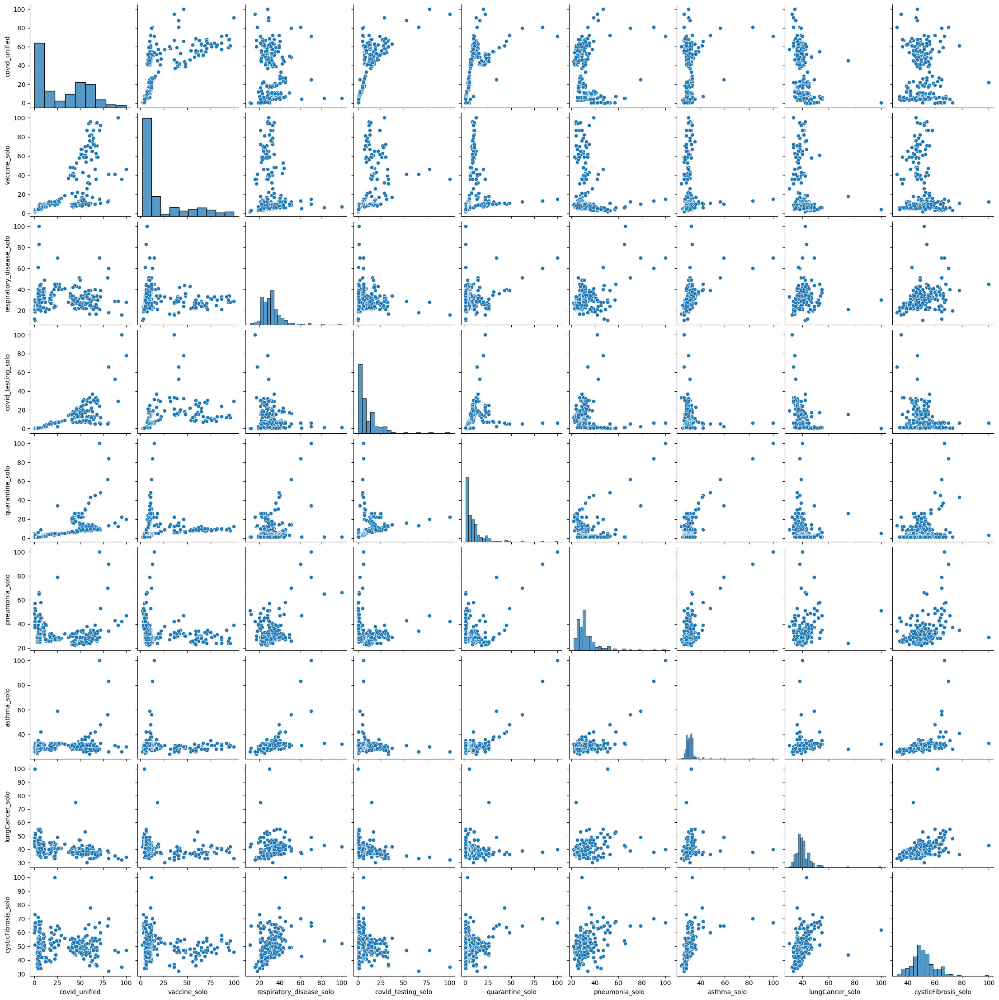

In [25]:
sns.pairplot(data=trends.loc[:,trendsSoloAttributes])

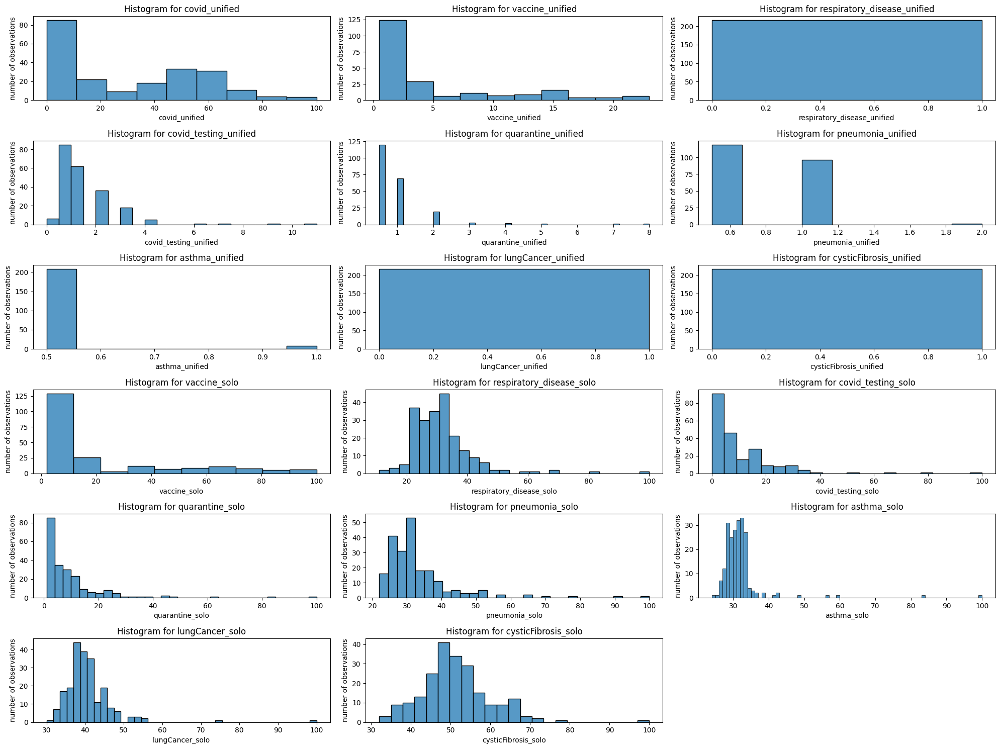

In [26]:
displayHistograms(trends)

* Widzimy, że peak'i wyszukiwań "solo" (największa liczba wyszukiwań dla danej frazy) występują bardzo rzadko. Dla Covida często utrzymywała się popularność na poziomie około 50% (stosunkowo sporo wyników z liczbą wyszukiwań stanowiącą około 50% najczęstszej liczby wyszukiwań)
* Unifikując dane z najczęściej wyszukiwanym Covidem ich skala bardzo się spłaszcza. Oznacza to, że fraza "Covid" była dużo bardziej popularnym wyszukiwaniem.
* Wyszukiwania "Respiratory diesease, lung cancer, cystic fibrosis, asthma, pneumonia" występowały niezwykle rzadko w czasie pandemii (unifikując z Covidem)
* Popularność cystic Fibrosis dosyć często była w okolicach 50 i powyżej procent
* Reszta zdecydowanie częściej przyjmuje wartości poniżej 50

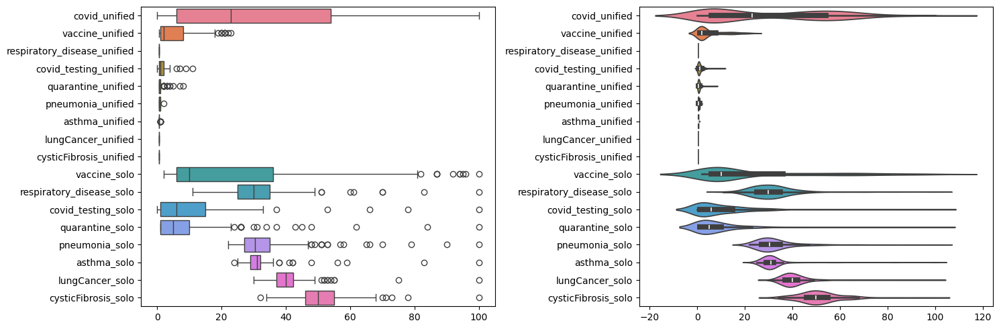

In [27]:
displayVariabilityPlotsWithoutClasses(trends, trends.columns)

* Również i tutaj widzimy, że poziomy zmienności danych zunifikowanych do Covidu są zdecydowanie mniejsze. Covid zdominował wyszukiwania w tamtym okresie
* liczba wyszukiwań covid ma rozkład dwumodalny (można przypuszczać, że w trakcie pandemii liczba wyszukiwań była na poziomie około 50%,natomiast przed i po pandemii była mniejsza liczba wyszukiwań. Dane obejmują okres od 2019 do 2024 roku)
* Pozostałe atrybuty rzadko osiągają maksymalne dla nich wartości popularności
* Widzimy, że atrybuty cysticFibrosis, lungCancer, asthma, pneumonia oraz respiratoryDisease praktycznie nigdy nie przyjmują wartości bliskich zero jeśli chodzi o poziom wyszukiwań. Może to być związane z tym, że te choroby występują przez cały czas z pewną minimalną częstością

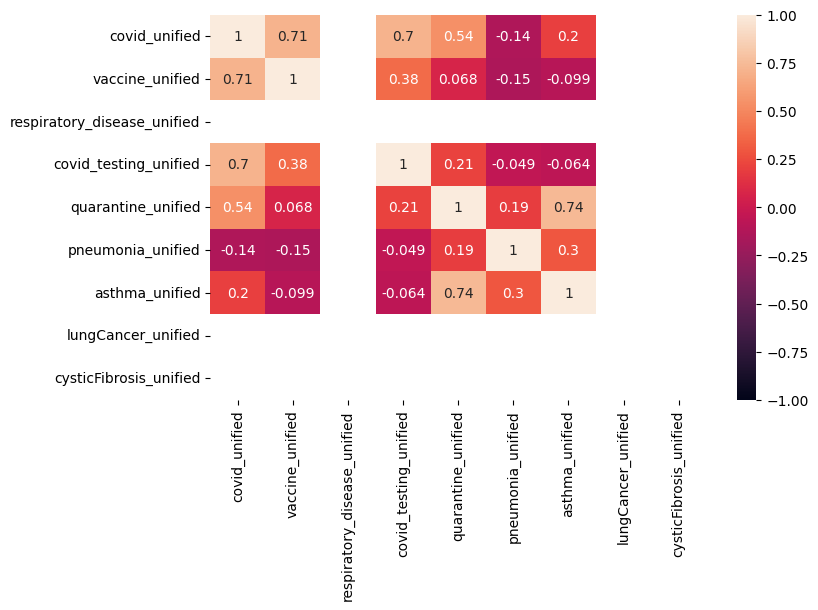

In [28]:
displayCorrelation(trends, trendsUnifiedAttributes)

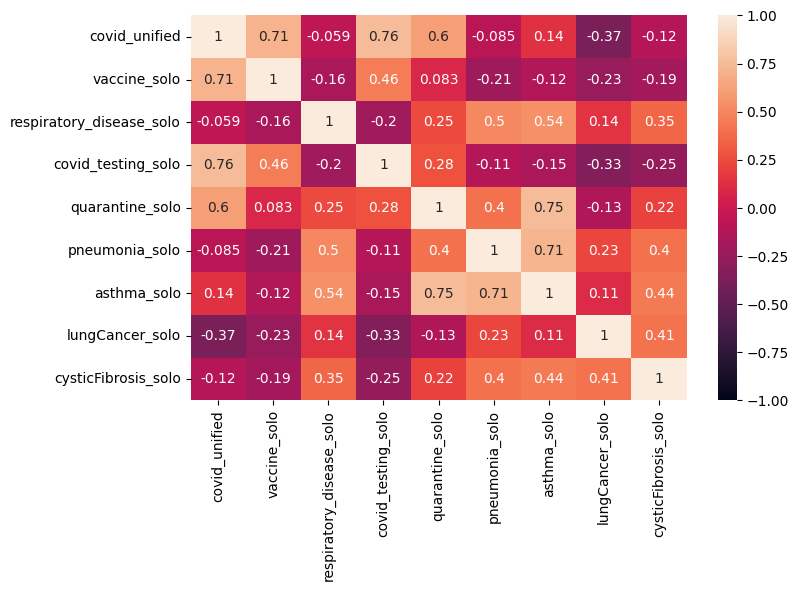

In [29]:
displayCorrelation(trends, trendsSoloAttributes)

* Widzimy dość dużą korelację wyszukiwań frazy "covid" oraz wyszukiwań frazy "covid Testing"
* Widzimy dość dużą korelację wyszukiwań frazy "covid" oraz wyszukiwań frazy "vaccine"
* Mniejsza korelacja występuje między wyszukiwaniami frazy "covid" oraz frazy "quarantine"
* wysoka korelacja występuje między kwarantanną, a astmą
* Widać dosyć dużą korelację między "asthma_solo", a "pneumonia_solo". Może być to powiązane z faktem mylenia tych chorób u części społeczeństwa w przypadku wystąpienia objawów związanymi z problemami z płucami, czy też oddychaniem.

<Axes: xlabel='week'>

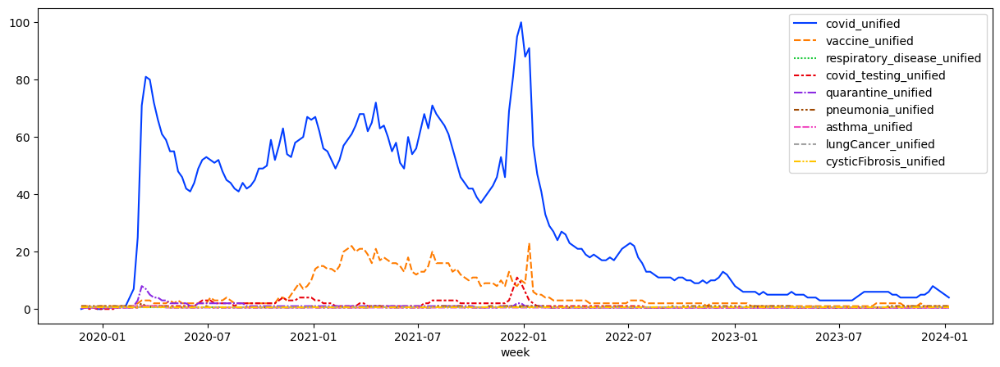

In [30]:
plt.figure(figsize=(15,5))
sns.lineplot(data=trends.loc[:,trendsUnifiedAttributes], palette="bright")

* Widzimy, potwierdzenie, że "covid" zdominował wyszukiwania. Gdy sprowadzimy wszystkie pozostałe wyszukiwania do skali "covid" to osiągają one niskie wartości maksymalne
* Drugą najpopularniejszą frazą były szczepionki
* fraza "covid" utrzymywała się na wysokim poziomie od jego początku na początku 2020 roku, a w 2022 roku zaczęła drastycznie spadać. Wiąże się to z początkami opanowywania pandemii.
* Szczepionki zaczęły interesować społeczeństwo pod koniec 2020 roku, a spadek zainteresowania zaczął się na początku 2022 roku.

<Axes: xlabel='week'>

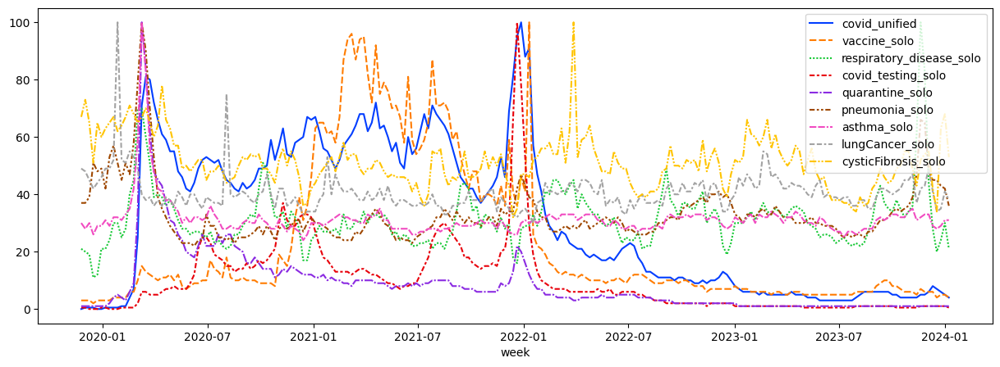

In [31]:
plt.figure(figsize=(15,5))
sns.lineplot(data=trends.loc[:,trendsSoloAttributes], palette="bright")

* Na początku pandemii obserwujemy szczyt wyszukiwań fraz "covid", "quarantine" oraz "respiratory_disease". Może to sugerować, że na początku ludzie nieświadomi wirusa mylili objawy z objawami chorób układu oddechowego.
* W tym okresie również ludzie pragnęli uzyskać jak najwięcej informacji o procesie kwarantanny.
* Z drugim szczytem "covidu" na początku 2022 roku zbiegają się szczyty wyszukiwań testów na covid oraz szczepionek.
* Pod koniec 2023 roku pojawił się szczyt wyszukiwań respiratory disease. Może to sugerować, że covid nie był już wtedy chorobą dominującą i ludzie nie podejrzewają każdej choroby o tych objawach jako covid.
* Peak wyszukiwania "szczepionek" był wtedy gdy zaczynały one być dostępne (2021 rok)

## Ramka: europeCasesAndTesting

In [32]:
europeCasesAndTesting.head(5)

,date,Country,Country_code,New_cases,Cumulative_cases,New_deaths,Cumulative_deaths,new_cases,tests_done,population,testing_rate,positivity_rate
0,2020-01-06,Austria,AT,0,0,0,0,0.0,0.0,8978929,0.0,0.0
1,2020-01-13,Austria,AT,0,0,0,0,0.0,0.0,8978929,0.0,0.0
2,2020-01-20,Austria,AT,0,0,0,0,0.0,0.0,8978929,0.0,0.0
3,2020-01-27,Austria,AT,0,0,0,0,0.0,0.0,8978929,0.0,0.0
4,2020-02-03,Austria,AT,0,0,0,0,0.0,0.0,8978929,0.0,0.0


Wyświetlimy zakres zmienności daty dla ramki europeCasesAndTesting

In [33]:
print("Zakres dat dla ramki europeCasesAndTesting")
print("Data początkowa: {0}".format(europeCasesAndTesting.loc[:,"date"].min()))
print("Data końcowa: {0}".format(europeCasesAndTesting.loc[:,"date"].max()))

Zakres dat dla ramki europeCasesAndTesting
Data początkowa: 2020-01-06 00:00:00
Data końcowa: 2023-11-20 00:00:00


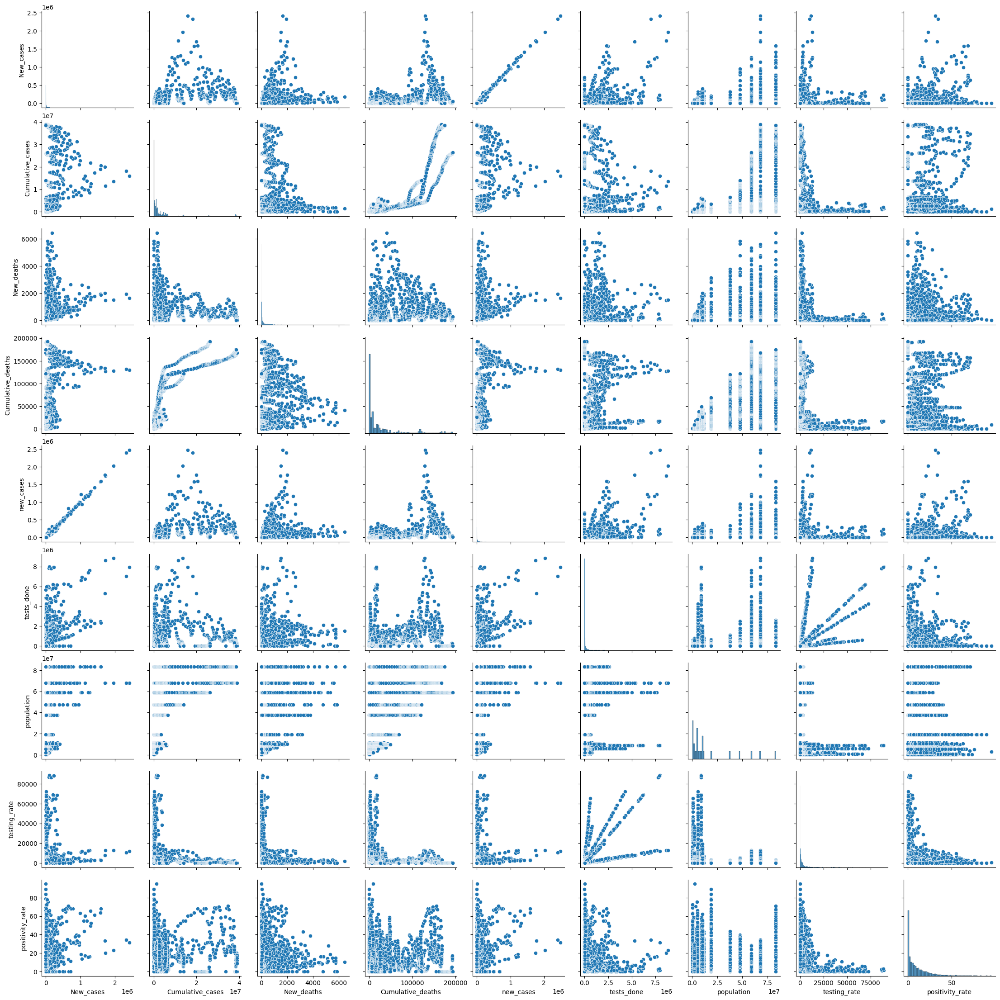

In [34]:
sns.pairplot(data=europeCasesAndTesting)

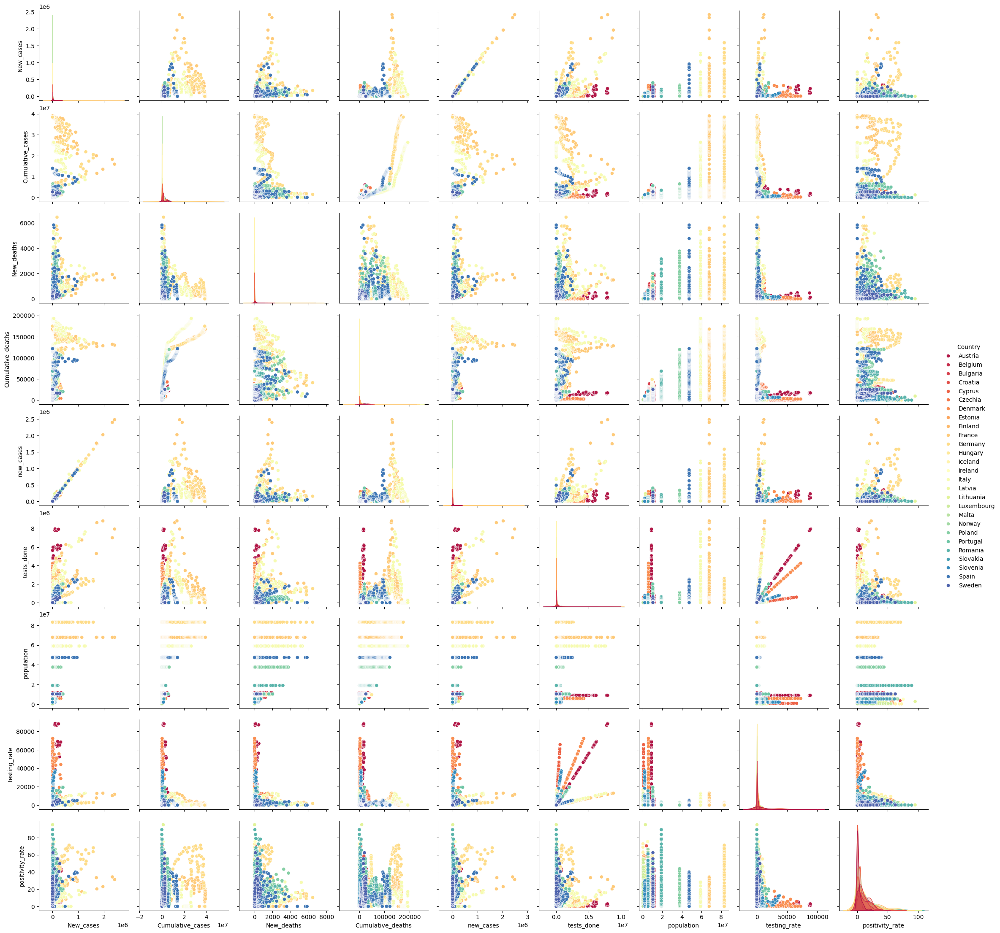

In [35]:
sns.pairplot(data=europeCasesAndTesting, hue="Country", palette=sns.color_palette("Spectral", n_colors=27))

* Również cumulative cases i cumulative deaths wyglądają na potencjalnie skorelowane
* populacja danego kraju nie jest aktualizowana w czasie (są stałe wartości populacji danego kraju)
* zależność positivity_rate od tests_done: im mniej osób się testowało, tym większy był positivity_rate (można przypuszczać, że początkowo testowały się osoby, które były faktycznie chore, a z upływem czasu możliwe, że z przezorności testowało się więcej osób nie mających covida)
* widzimy korelację testing done z testing rate dla poszczególnych krajów (punkty tworzące dane linie są w przybliżeniu jednego koloru)
* Im mniejsza populacja tym mniejszy kąt nachylenia prostej tests_done od testing_rate (tests_done zależne od testing_rate) (Francja największy, Austria, Portugalia i Dania mniejszy, Cypr najmniejszy)
* Widzimy ciekawą relację między cumulative cases a cumulative deaths dla Włoch i Niemiec. Najpierw śmierci rosną drastycznie, a w miarę upływu czasu następuje znaczne wypłaszczenie tej relacji. Można przypuszczać, że na początku pandemii COVID był bardzo śmiertelny dla Niemiec i Włoch, a potem śmiertelność została drastycznie opanowana. Te kraje radziły sobie dobrze z opanowywaniem pandemii.   
W przypadku Hiszpanii śmiertelność po czasie maleje, a potem znów rośnie.   
Dla reszty krajów obserwacje są skumulowane
* Widzimy, że w zbiorze danych występuje dwa razy kolumna "new_cases", która była w obydwu zbiorach. Pomimo, że dane są z dwóch ramek, nie różnią się one znacząco i są silnie ze sobą skorelowane

In [36]:
europeCasesAndTesting = europeCasesAndTesting.drop(columns="new_cases") #usunięcie new cases, które dwukrotnie występowało w zbiorze danych

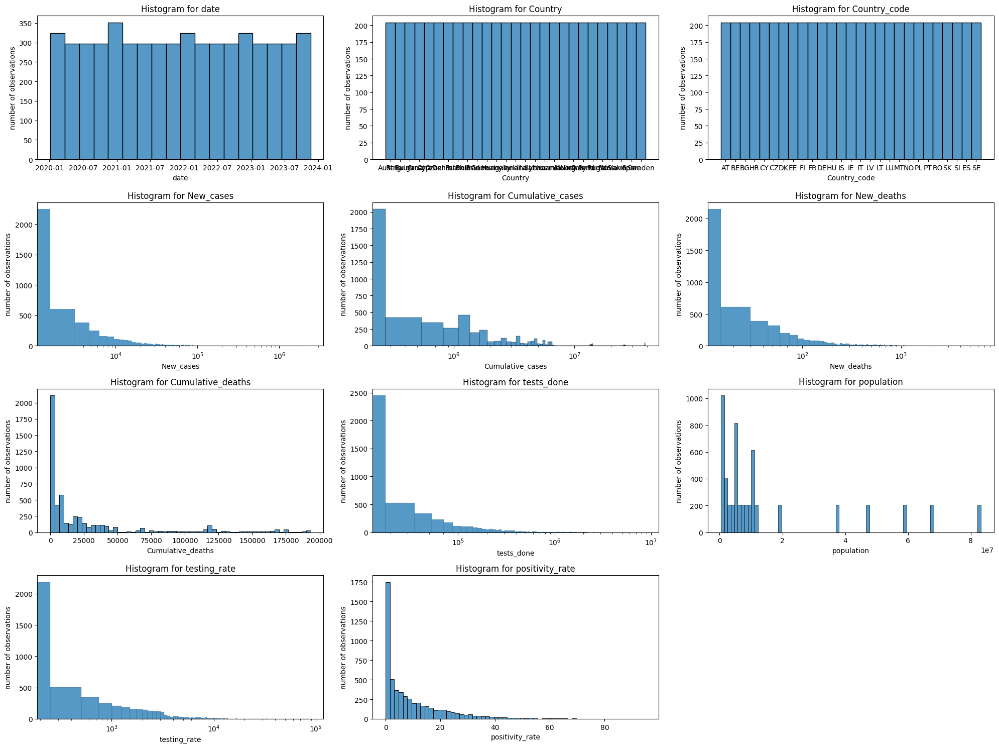

In [37]:
logharithmicAttributes = ["New_cases", "Cumulative_cases", "New_deaths", "tests_done", "testing_rate"]
displayHistograms(europeCasesAndTesting, logharithmicAttributes)

* Po histogramie Cumulative_deaths możemy przypuszczać, że pandemia rozpoczynała się powoli i było stosunkowo mało przypadków śmierci
* wartości na histogramie cumulative_deaths nie maleją stale. Gdy dana liczba cumulative_deaths jest ustabilizowana i występuje przez dłuższy czas to słupek jest wyższy. Nowa fala covidu powoduje, że rośnie liczba cumulative deaths i następuje przejście do następnego słupka, który jest niższy jeśli szybko będzie rosnąć liczba zgonów.
* z histogramu positivity_rate: najczęściej wynik testowania jest negatywny
* z histogramu new_cases: gdy było mało nowych przypadków to było najwięcej obserwacji. Można przypuszczać, że jest to związana z tym, że pandemia rozwijała się powoli

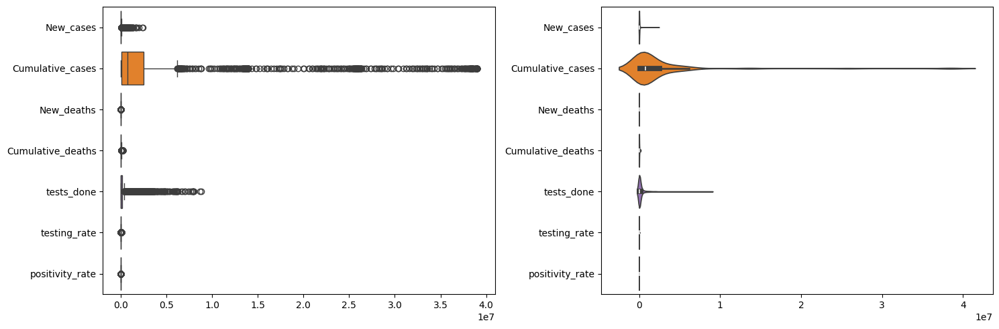

In [38]:
europeCasesAndTestingColumnsWithoutPopulation = ["New_cases", "Cumulative_cases", "New_deaths", "Cumulative_deaths", 
                                                 "tests_done", "testing_rate", "positivity_rate"]
displayVariabilityPlotsWithoutClasses(europeCasesAndTesting, europeCasesAndTestingColumnsWithoutPopulation)

* Cumulative cases ma zdecydowanie największy przedział zmienności, dlatego, że liczba cumulative cases stale rośnie lub utrzymuje się na stałym poziomie pomimo, że ogromna liczba z nich to obserwacje odstające. Natomiast cumulative_deaths przyjmuje mniejsze wartości i nie rośnie tak bardzo, co oznacza że covid nie jest bardzo śmiertelny. Podobnie jak dla cumulative cases jest z tests_done

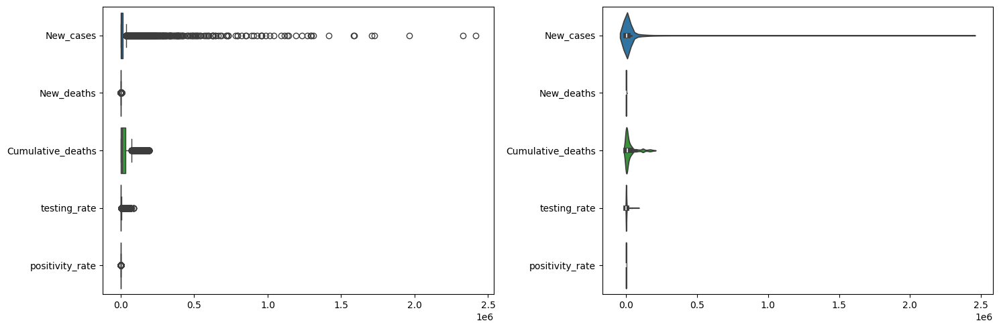

In [39]:
europeCasesAndTestingColumnsWithoutPopulation = ["New_cases", "New_deaths", "Cumulative_deaths", 
                                                 "testing_rate", "positivity_rate"] #wyłączenie cumulative cases i tests_done (miały największy zakres zmienności)
displayVariabilityPlotsWithoutClasses(europeCasesAndTesting, europeCasesAndTestingColumnsWithoutPopulation)

* Większość z atrybutów ma bardzo dużą liczbę obserwacji odstających

In [40]:
europeCasesAndTestingNumerical = ["New_cases", "Cumulative_cases", "New_deaths", "Cumulative_deaths", "tests_done", 
                                  "population", "testing_rate", "positivity_rate"]

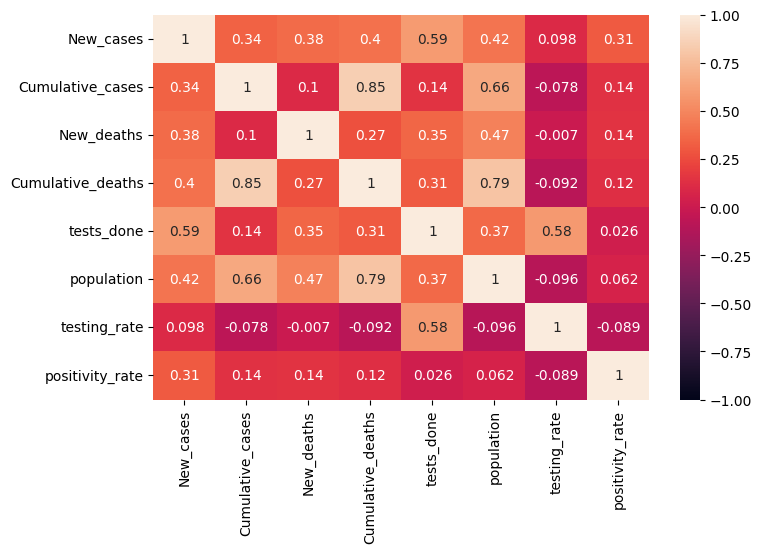

In [41]:
displayCorrelation(europeCasesAndTesting, europeCasesAndTestingNumerical)

* Silna korelacja występuje między sumą przypadków a sumą zgonów. Jest to logiczne
* Również pomiędzy populacją, a sumą zgonów oraz populacją, a sumą przypadków obserwujemy korelację (większą przy sumie zgonów)
* Pewna (ale zdecydowanie słabsza) korelacja występuje między liczbą wykonanych testów, a liczbą nowych przypadków tygodniowych
* Podobna sytuacja występuje przy rozważeniu liczby wykonanych testów tygodniowo (tests_done) wraz z procentem przetestowanych osób na 100_000 (testing rate)

## Ramka: europeVaccinationsAndTesting

In [42]:
europeVaccinationsAndTesting.head(5)

,date,country,country_code,new_cases,tests_done,population,testing_rate,positivity_rate,totalVaccinations,weeklyVaccinations
0,2021-01-04,Austria,AT,14916.0,127657.0,8978929,1421.739720,11.684436,31790.0,0.0
1,2021-01-04,Austria,AT,14636.0,137035.0,8978929,1526.184248,10.680483,31790.0,0.0
2,2021-01-11,Austria,AT,10948.0,911735.0,8978929,10154.162039,1.200788,117665.0,12268.0
3,2021-01-18,Austria,AT,10156.0,1144351.0,8978929,12744.849636,0.887490,216189.0,14075.0
4,2021-01-25,Austria,AT,9513.0,655713.0,8978929,7302.797472,1.450787,265704.0,7074.0


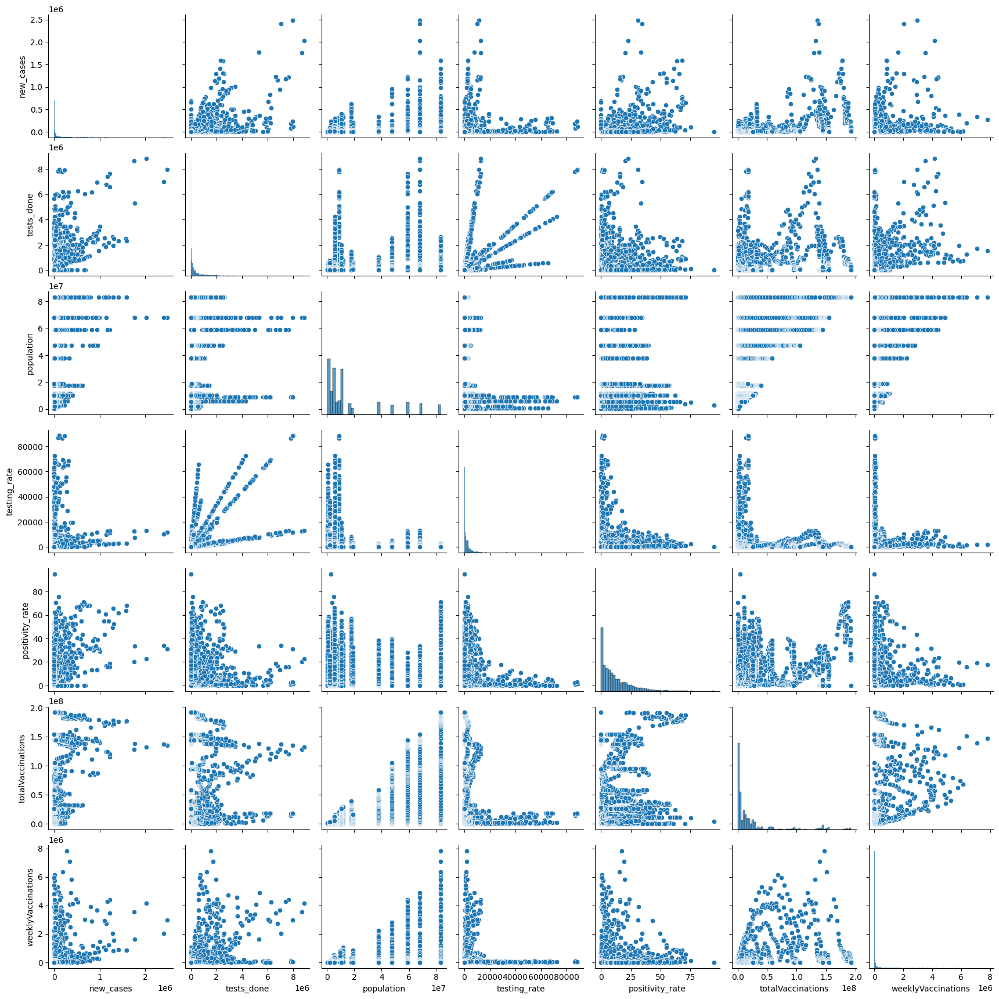

In [43]:
sns.pairplot(data=europeVaccinationsAndTesting)

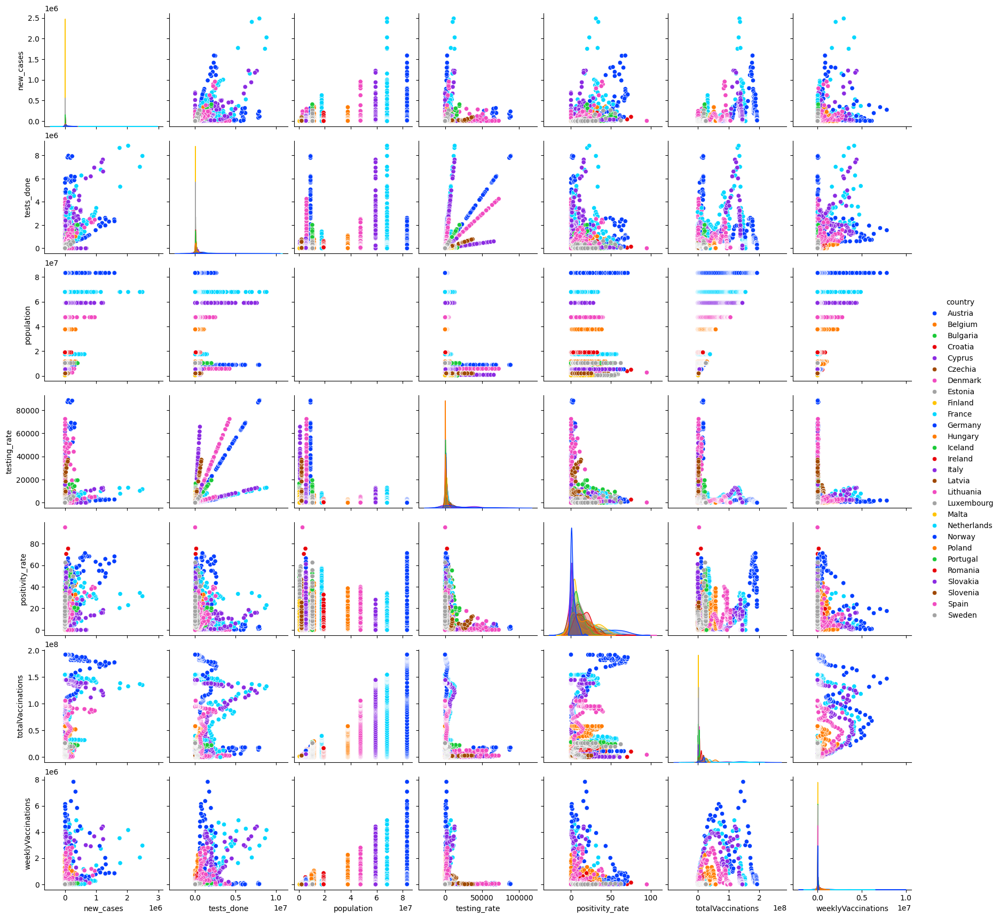

In [44]:
sns.pairplot(data=europeVaccinationsAndTesting, hue="country", palette="bright")

* populacje dla danych krajów są stałe
* gdy było najmniejsze testing_rate to było najwięcej szczepień tygodniowych oraz łącznych
* testing rate jest skorelowany z testing done dla każdego kraju
* populacja jest atrybutem dyskretnym (przyjmuje konkretne wartości dla danych krajów), dlatego nie ma dla niej narysowanego rozkładu prawdopodobieństwa

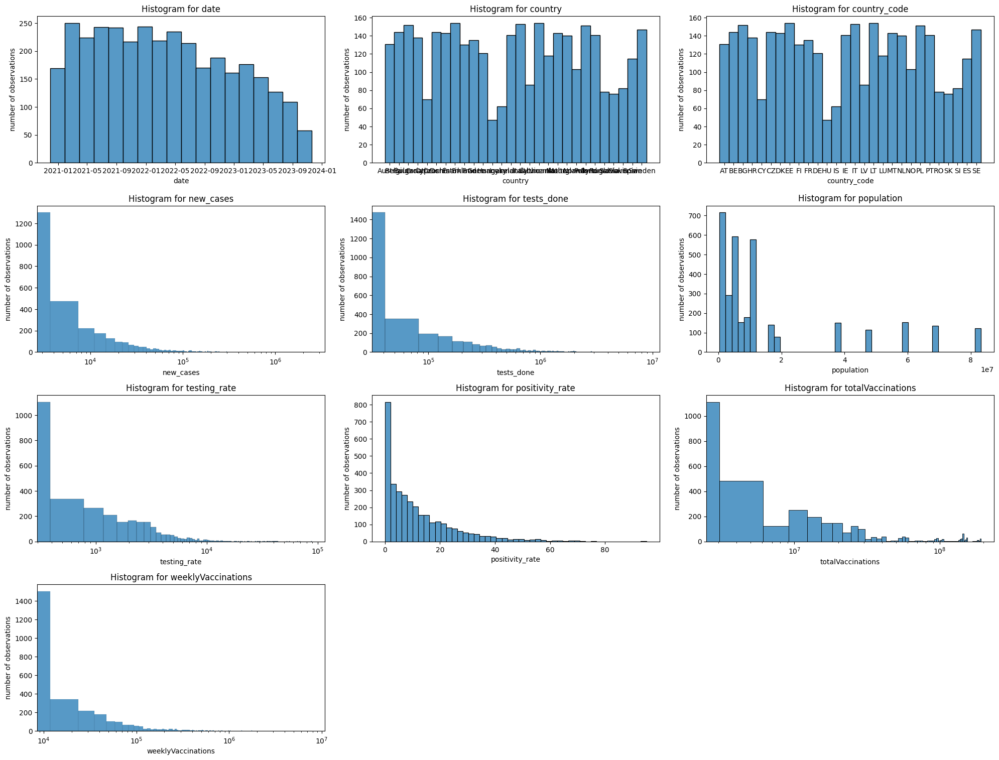

In [45]:
logharithmicAttributes = ["new_cases", "tests_done", "testing_rate", "totalVaccinations", "weeklyVaccinations"]
displayHistograms(europeVaccinationsAndTesting, logharithmicAttributes)

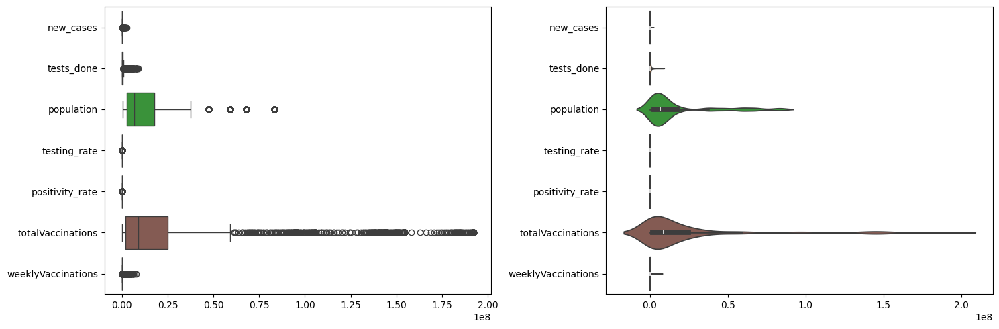

In [46]:
displayVariabilityPlotsWithoutClasses(europeVaccinationsAndTesting, europeVaccinationsAndTesting.columns)

* Poziom zmienności total_vaccinations jest większy niż poziom zmienności populacji. Zjawisko to można obronić tym, że wiele osób przyjęło kilka dawek szczepionki

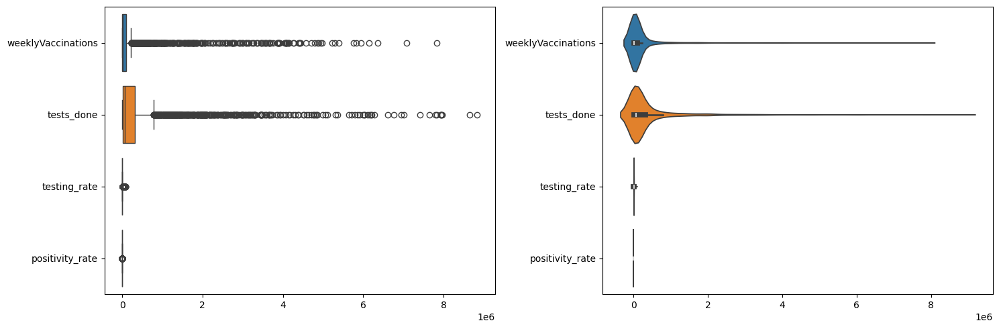

In [47]:
europeVaccinationAndTestingColumnsWithoutPopulationAndCases = ["weeklyVaccinations", "tests_done", "testing_rate", "positivity_rate"]
displayVariabilityPlotsWithoutClasses(europeVaccinationsAndTesting, europeVaccinationAndTestingColumnsWithoutPopulationAndCases)

* W tym przypadku również widzimy wiele obserwacji odstających dla tests done i weekly vaccinations. Zdecydowana większość obserwacji skupia się w najmniejszych wartosciach na osi X (kolorowych polach). Duże wartości odstające związane są ze stosunkowo dużą liczbą szczepień/wykonań testów w danym tygodniu. Zdecydowanie więcej było tygodni, w których nie było aż tak wiele vaccinations ani tests done.
* Liczba wykononanych testów ma większy, ale podobny poziom zmienności co liczba tygodniowo wykonanych szczepień

In [48]:
europeVaccinationsAndTestingNumerical = ["new_cases", "tests_done", "population", "testing_rate", "positivity_rate",
                                          "totalVaccinations", "weeklyVaccinations"]

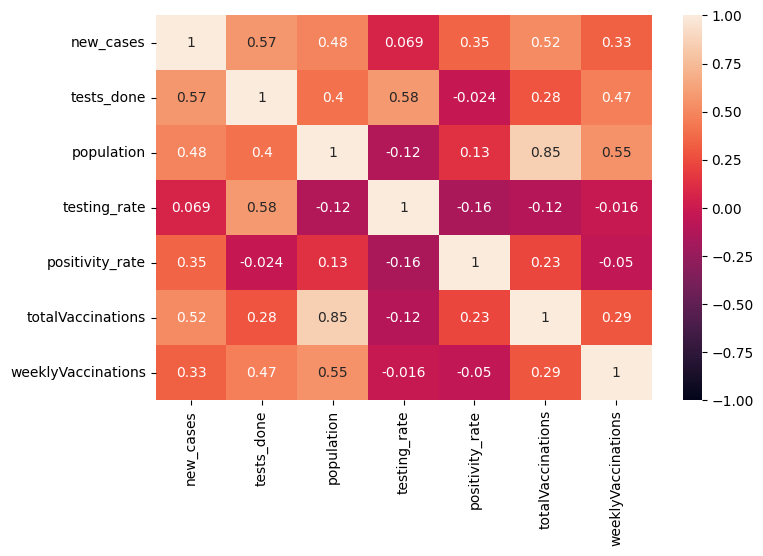

In [49]:
displayCorrelation(europeVaccinationsAndTesting, europeVaccinationsAndTestingNumerical)

* Obserwujemy wysoką korelację pomiędzy sumą wykonanych szczepień, a populacją, co jest logiczne

## Ramka: globalCasesAndVaccinations

In [50]:
globalCasesAndVaccinations.head(5)

,date,Country,Country_code,iso_code,WHO_region,New_cases,Cumulative_cases,New_deaths,Cumulative_deaths,totalVaccinations,weeklyVaccinations
0,2021-02-22,Afghanistan,AF,AFG,EMRO,110,55714,11,2443,8200.0,1367.0
1,2021-03-15,Afghanistan,AF,AFG,EMRO,118,56103,6,2463,54000.0,2862.0
2,2021-04-05,Afghanistan,AF,AFG,EMRO,484,57160,24,2521,120000.0,3000.0
3,2021-04-19,Afghanistan,AF,AFG,EMRO,1050,58843,43,2582,240000.0,8000.0
4,2021-05-10,Afghanistan,AF,AFG,EMRO,1642,63484,56,2742,504502.0,13921.0


Pokażemy zakres zmienności dat dla ramki globalCasesAndVaccinations

In [51]:
print("Zakres dat dla ramki globalCasesAndVaccinations")
print("Data początkowa: {0}".format(globalCasesAndVaccinations.loc[:,"date"].min()))
print("Data końcowa: {0}".format(globalCasesAndVaccinations.loc[:,"date"].max()))

Zakres dat dla ramki globalCasesAndVaccinations
Data początkowa: 2020-11-30 00:00:00
Data końcowa: 2023-12-25 00:00:00


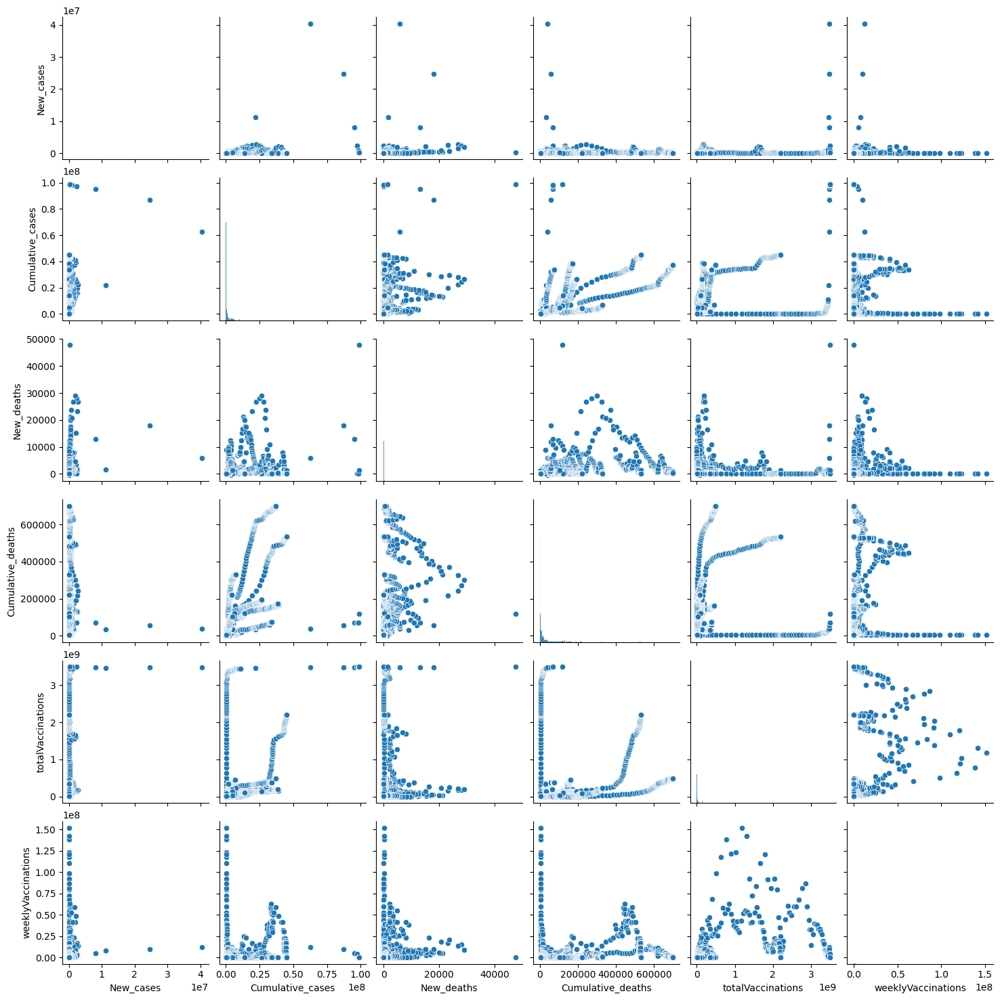

In [52]:
sns.pairplot(data=globalCasesAndVaccinations)

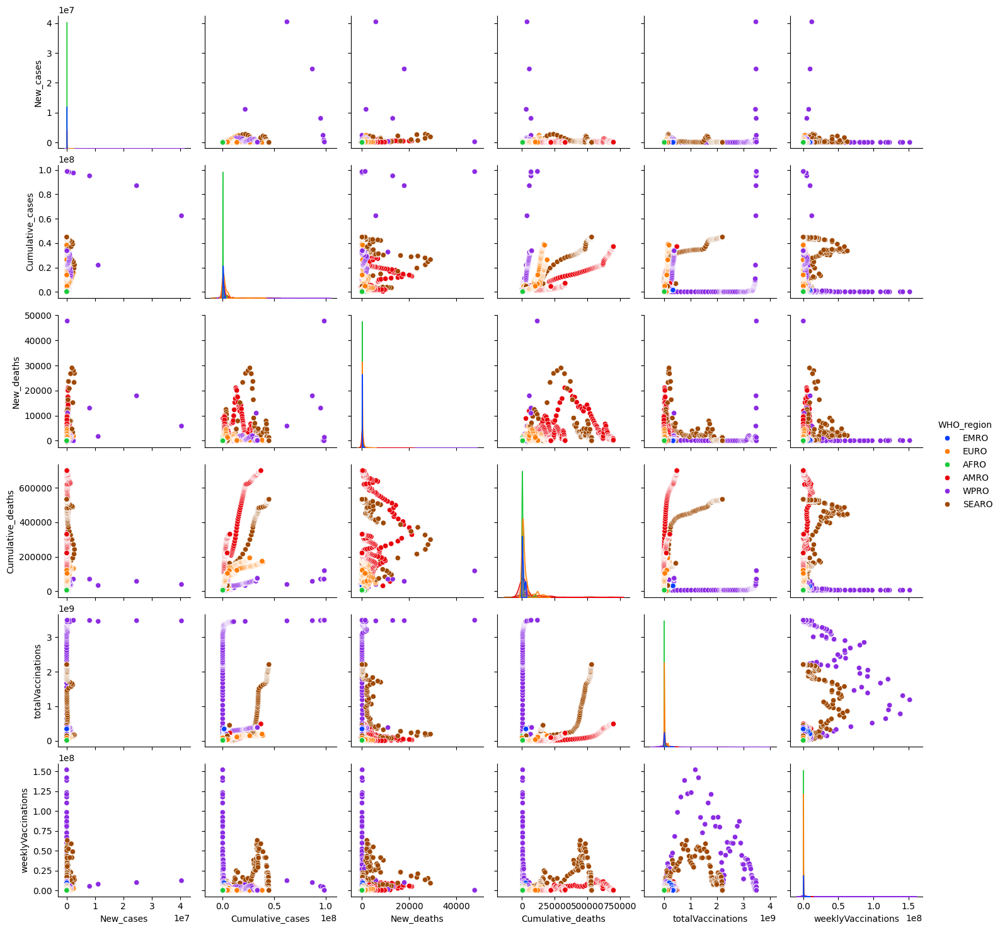

In [53]:
sns.pairplot(data=globalCasesAndVaccinations, hue="WHO_region", palette="bright")

* wyróżnia się tutaj zdecydowanie region WPRO (Western Pacific Region), który ma praktycznie zerowe dane o nowych przypadkach zachorowań i śmierci. Może to być spowodowane tym, że w regionie WPRO znajduje się dużo wysp o małej liczbie ludności. Istnieje też możliwość, że dla WPRO dane o cumulative deaths, cumulative cases, new deaths mogły nie być dostępne i zostały uzupełnione zerami
* po przekroczeniu pewnego progu łącznej liczby zgonów dla SEARO liczba szczepień zaczęła drastycznie rosnąć
* dla AMRO (Ameryka Południowa i Północna) i SEARO (południowo-wschodnia Azja) w miarę wzrostu cumulative_cases, gwałtowanie rośnie liczba śmierci (może być związane to z tym, że to Afryka i służba zdrowia jest słabo rozwinięta)
* Dla kontrastu, EURO (Europa) i WPRO (Region Pacyficzny ) jest mniejsza liczba śmierci zależnie od sumy przypadków
* w SEARO gwałtownie wzrosła liczba szczepień


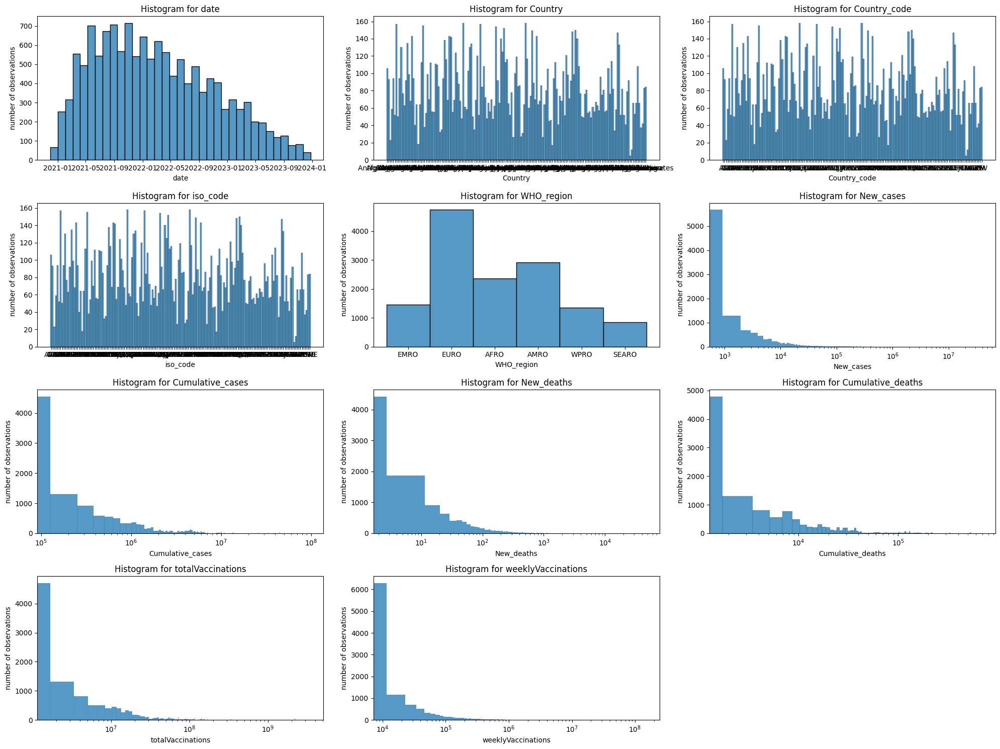

In [54]:
logharithmicAttributes = ["New_cases", "Cumulative_cases", "New_deaths", "Cumulative_deaths", "totalVaccinations", "weeklyVaccinations"]
displayHistograms(globalCasesAndVaccinations, logharithmicAttributes)

Zobaczymy jak wygląda ramka danych dla regiony WPRO

In [55]:
wpro = globalCasesAndVaccinations[globalCasesAndVaccinations["WHO_region"] == "WPRO"]
wpro

,date,Country,Country_code,iso_code,WHO_region,New_cases,Cumulative_cases,New_deaths,Cumulative_deaths,totalVaccinations,weeklyVaccinations
634,2021-02-15,Australia,AU,AUS,WPRO,28,28926,1,924,20.0,0.0
635,2021-02-22,Australia,AU,AUS,WPRO,44,28970,0,924,34630.0,33876.0
636,2021-03-01,Australia,AU,AUS,WPRO,67,29037,0,924,86369.0,46305.0
637,2021-03-08,Australia,AU,AUS,WPRO,80,29117,1,925,164781.0,68497.0
638,2021-03-15,Australia,AU,AUS,WPRO,79,29196,0,925,281960.0,99344.0
...,...,...,...,...,...,...,...,...,...,...,...
13455,2022-08-08,Vanuatu,VU,VUT,WPRO,3,11734,0,14,287803.0,383.0
13456,2022-08-15,Vanuatu,VU,VUT,WPRO,36,11770,0,14,289912.0,301.0
13457,2022-10-17,Vanuatu,VU,VUT,WPRO,5,11981,0,14,292146.0,35.0
13458,2022-11-07,Vanuatu,VU,VUT,WPRO,0,11981,0,14,293584.0,68.0


Sprawdzimy maksymalną liczbę sumy przypadków dla tego regionu

In [56]:
wpro[wpro["Cumulative_cases"] == wpro["Cumulative_cases"].max()] #wiersz, w którym największa liczba cumulative cases (było to w Chinach)

,date,Country,Country_code,iso_code,WHO_region,New_cases,Cumulative_cases,New_deaths,Cumulative_deaths,totalVaccinations,weeklyVaccinations
2787,2023-02-06,China,CN,CHN,WPRO,148174,98785727,1360,118926,3.491077e+09,94000.0


<Axes: >

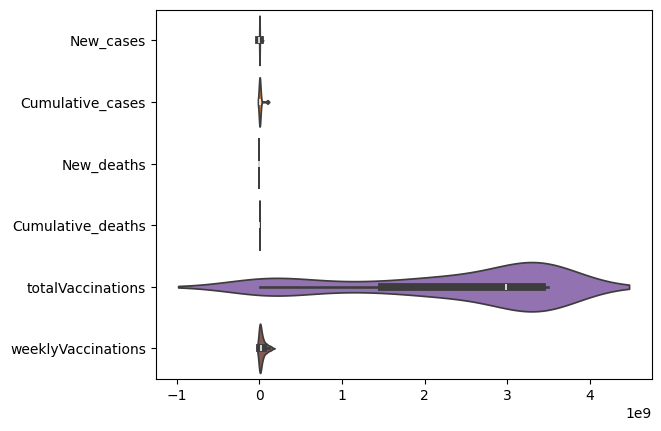

In [57]:
sns.violinplot(wpro[wpro["Country"] == "China"], orient="y")

* Chiny rozdystrybuowały nawet 3.5 miliarda szczepionek! Jest to olbrzymia liczba jednak na podstawie danych z poniższego źródła nie powinna ona dziwić. 90% obywateli Chin przyjęło dwie dawki, a należy pamiętać również o boosterach (trzeciej i każdej kolejnej dawce) 
https://en.wikipedia.org/wiki/COVID-19_vaccination_in_mainland_China
* Po bardziej dokładnej analizie taka dysproporcja nie powinna dziwić ze względu na obecność właśnie Chin, które bardzo zawyżają skalę w porównaniu do pomniejszych krajów WPRO

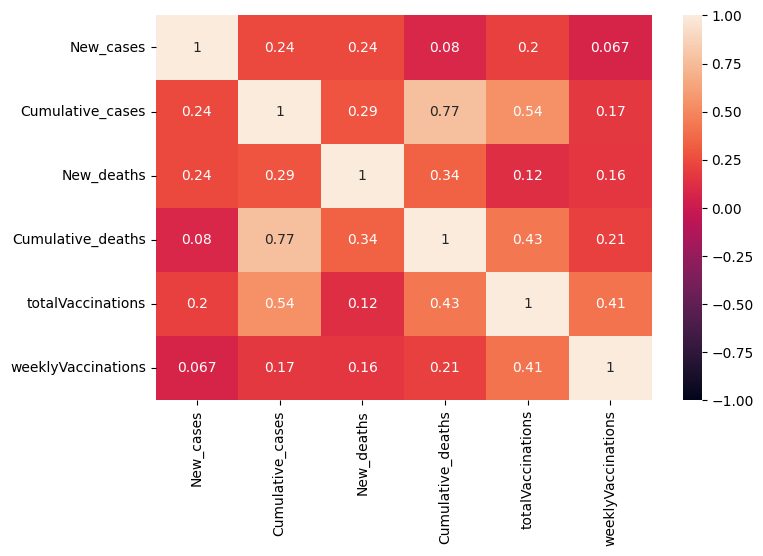

In [58]:
globalCasesAndVaccinationsNumerical = ["New_cases", "Cumulative_cases", "New_deaths", "Cumulative_deaths",
                                          "totalVaccinations", "weeklyVaccinations"]
displayCorrelation(globalCasesAndVaccinations, globalCasesAndVaccinationsNumerical)

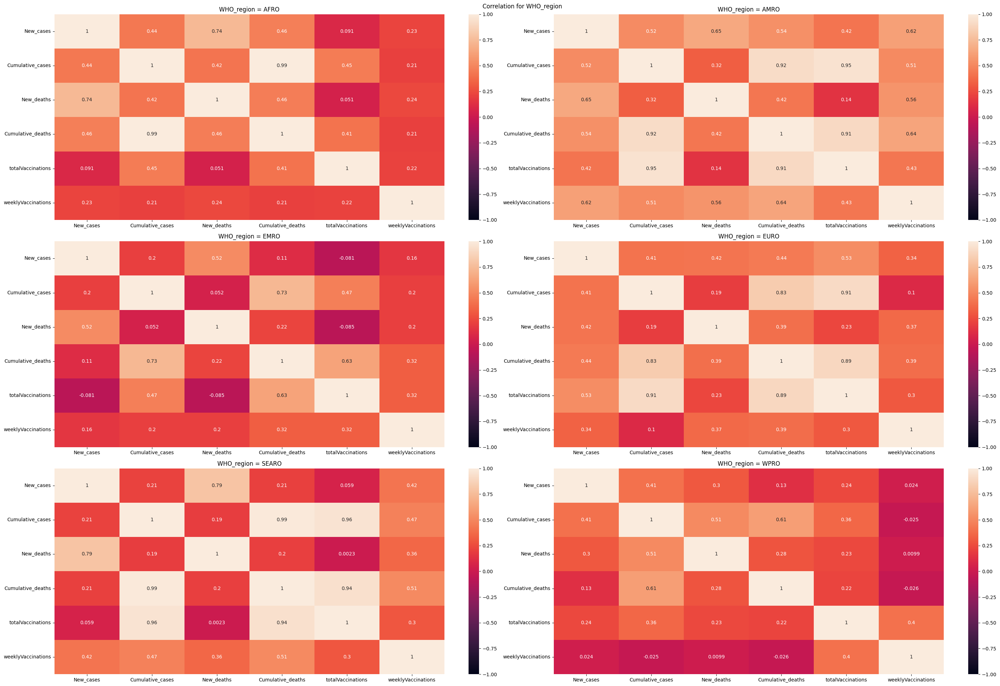

In [59]:
analyseCorrelationInCategories(globalCasesAndVaccinations, globalCasesAndVaccinationsNumerical, "WHO_region")

1. AFRO (Region Afrykański): 
* niemal idealna korelacja sumy przypadków i zgonów
* zauważalna korelacja nowych przypadków i nowych śmierci
2. AMRO (Region obu Ameryk):
* bardzo duża korelacja między sumą przypadków i sumą zgonów
* bardzo duża korelacja między sumą przypadków i sumą wykonanych szczepionek
* bardzo duża korelacja między sumą zgonów i sumą wykonanych szczepionek
* występuje bardzo silna korelacja między tymi trzema atrybutami
3. EMRO (Region Bliskowschodni):
* zauważalna korelacja sumy przypadków i zgonów jednak dużo mniejsza niż w dwóch poprzednich regionach
4. EURO (Region Europejski):
* Podobnie jak w AMRO, silna korelacja między trójką: suma przypadków, suma zgonów i suma wykonanych szczepionek (jednak niższa niż w AMRO)
5. SEARO (Region Południowo-Wschodniej Azji):
* Podobnie jak w AMRO, silna korelacja między trójką: suma przypadków, suma zgonów i suma wykonanych szczepionek (jednak wyższa niż w AMRO)
* Zauważalna korelacja między nowymi śmierciami i nowymi przypadkami
6. WPRO (Region Zachodniego Pacyfiku):
* Zauważalna (ale w porównaniu do innych regionów bardzo niska) korelacja między sumą zachorowań i zgonów.

----
* Dla macierzy korelacji bez podziału na regiony jednym związkiem była korelacja między sumą przypadków, a sumą zgonów.
* Po podziale na regiony widzimy, że w połowie regionów obserwujemy związek między sumą przypadków, zgonów oraz szczepionek

## Połączenie europeCasesAndTesting z Trends

In [60]:
combinedEuropeCasesTestingAndTrends = pd.merge(europeCasesAndTesting, trends.loc[:,trendsSoloAttributes], how ='inner', left_on = "date", right_index=True)
combinedEuropeCasesTestingAndTrends = combinedEuropeCasesTestingAndTrends.sort_index()
combinedEuropeCasesTestingAndTrends

,date,Country,Country_code,New_cases,Cumulative_cases,New_deaths,Cumulative_deaths,tests_done,population,testing_rate,positivity_rate,covid_unified,vaccine_solo,respiratory_disease_solo,covid_testing_solo,quarantine_solo,pneumonia_solo,asthma_solo,lungCancer_solo,cysticFibrosis_solo
0,2020-01-06,Austria,AT,0,0,0,0,0.0,8978929,0.000000,0.000000,0.5,3,21,0.5,1,42,31,49,63
1,2020-01-13,Austria,AT,0,0,0,0,0.0,8978929,0.000000,0.000000,0.5,3,24,0.0,2,53,29,49,65
2,2020-01-20,Austria,AT,0,0,0,0,0.0,8978929,0.000000,0.000000,0.5,4,30,0.0,4,57,32,52,67
3,2020-01-27,Austria,AT,0,0,0,0,0.0,8978929,0.000000,0.000000,0.5,4,30,0.0,5,51,32,100,62
4,2020-02-03,Austria,AT,0,0,0,0,0.0,8978929,0.000000,0.000000,1.0,4,25,0.5,4,45,31,52,64
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5503,2023-10-23,Sweden,SE,1286,2720686,52,25012,7317.0,10452326,70.003557,27.224272,4.0,6,32,0.5,1,35,32,45,55
5504,2023-10-30,Sweden,SE,2730,2723416,105,25117,8819.0,10452326,84.373564,30.955891,4.0,6,34,0.5,1,36,34,45,55
5505,2023-11-06,Sweden,SE,3523,2726939,169,25286,10180.0,10452326,97.394589,34.607073,4.0,6,36,0.5,1,39,35,47,49
5506,2023-11-13,Sweden,SE,3344,2730283,193,25479,10297.0,10452326,98.513958,32.475478,4.0,5,61,0.5,1,47,31,37,43


Pokażemy poziom zmienności daty dla ramki combinedEuropeCasesTestingAndTrends

In [61]:
print("Zakres dat dla ramki combinedEuropeCasesTestingAndTrends")
print("Data początkowa: {0}".format(combinedEuropeCasesTestingAndTrends.loc[:,"date"].min()))
print("Data końcowa: {0}".format(combinedEuropeCasesTestingAndTrends.loc[:,"date"].max()))

Zakres dat dla ramki combinedEuropeCasesTestingAndTrends
Data początkowa: 2020-01-06 00:00:00
Data końcowa: 2023-11-20 00:00:00


<Axes: >

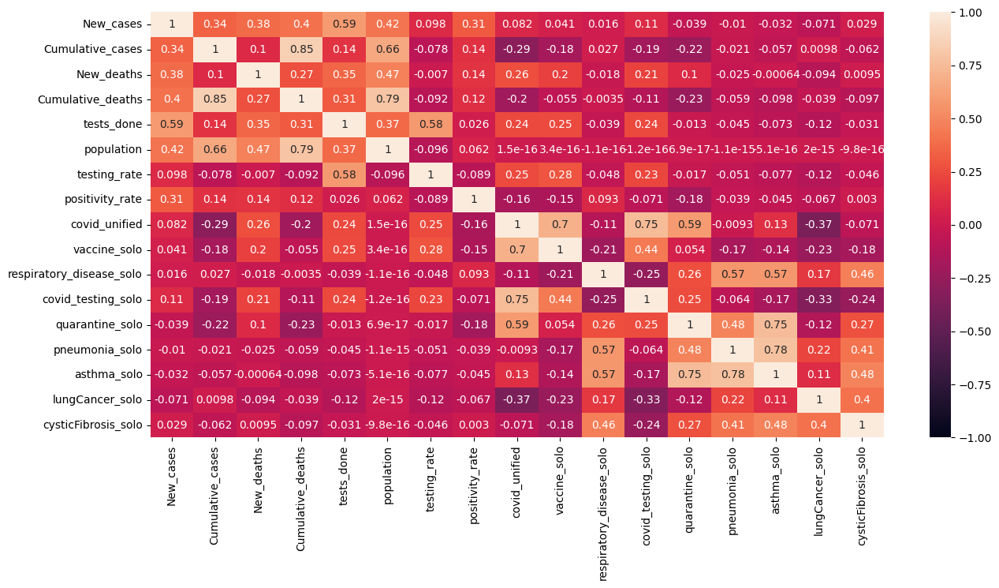

In [62]:
plt.figure(figsize=(15,7))
sns.heatmap(data=combinedEuropeCasesTestingAndTrends.iloc[:,list(range(3, 20))].corr(), annot=True, vmin=-1, vmax=1)

* szukamy korelacji między atrybutami solo, a zgonami, przypadkami i zrobionymi testami
* Nie obserwujemy żadnej sensownej korelacji pomiędzy liczbami wyszukiwań solo, a testami i przypadkami w Europie
* Również wyniki korelacji dla wyszukiwań solo się praktycznie nie zmieniły

## Połączenie europeVaccinationsAndTesting z Trends

In [63]:
combinedEuropeVaccinationsTestingAndTrends = pd.merge(europeVaccinationsAndTesting, trends.loc[:,trendsSoloAttributes], how ='inner', left_on = "date", right_index=True)
combinedEuropeVaccinationsTestingAndTrends = combinedEuropeVaccinationsTestingAndTrends.sort_index()
combinedEuropeVaccinationsTestingAndTrends

,date,country,country_code,new_cases,tests_done,population,testing_rate,positivity_rate,totalVaccinations,weeklyVaccinations,covid_unified,vaccine_solo,respiratory_disease_solo,covid_testing_solo,quarantine_solo,pneumonia_solo,asthma_solo,lungCancer_solo,cysticFibrosis_solo
0,2021-01-04,Austria,AT,14916.0,127657.0,8978929,1421.739720,11.684436,31790.0,0.0,67.0,63,26,27.0,11,30,30,34,44
1,2021-01-04,Austria,AT,14636.0,137035.0,8978929,1526.184248,10.680483,31790.0,0.0,67.0,63,26,27.0,11,30,30,34,44
2,2021-01-11,Austria,AT,10948.0,911735.0,8978929,10154.162039,1.200788,117665.0,12268.0,62.0,65,29,22.0,11,30,30,38,47
3,2021-01-18,Austria,AT,10156.0,1144351.0,8978929,12744.849636,0.887490,216189.0,14075.0,56.0,65,27,18.0,12,29,29,40,49
4,2021-01-25,Austria,AT,9513.0,655713.0,8978929,7302.797472,1.450787,265704.0,7074.0,55.0,61,27,17.0,10,28,30,53,51
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3394,2023-10-02,Sweden,SE,698.0,4834.0,10452326,46.248079,14.439388,26253144.0,354.0,5.0,8,34,1.0,1,34,33,40,45
3395,2023-10-09,Sweden,SE,964.0,5555.0,10452326,53.146065,17.353735,26262103.0,1280.0,5.0,8,38,0.5,1,35,33,41,49
3396,2023-10-16,Sweden,SE,1286.0,6132.0,10452326,58.666368,20.971950,26274229.0,1732.0,4.0,7,35,0.5,1,34,32,42,50
3397,2023-10-23,Sweden,SE,1992.0,7317.0,10452326,70.003557,27.224272,26317969.0,6249.0,4.0,6,32,0.5,1,35,32,45,55


Pokażemy poziom zmienności daty dla ramki combinedEuropeVaccinationsTestingAndTrends

In [64]:
print("Zakres dat dla ramki combinedEuropeVaccinationsTestingAndTrends")
print("Data początkowa: {0}".format(combinedEuropeVaccinationsTestingAndTrends.loc[:,"date"].min()))
print("Data końcowa: {0}".format(combinedEuropeVaccinationsTestingAndTrends.loc[:,"date"].max()))

Zakres dat dla ramki combinedEuropeVaccinationsTestingAndTrends
Data początkowa: 2020-11-30 00:00:00
Data końcowa: 2023-11-20 00:00:00


<Axes: >

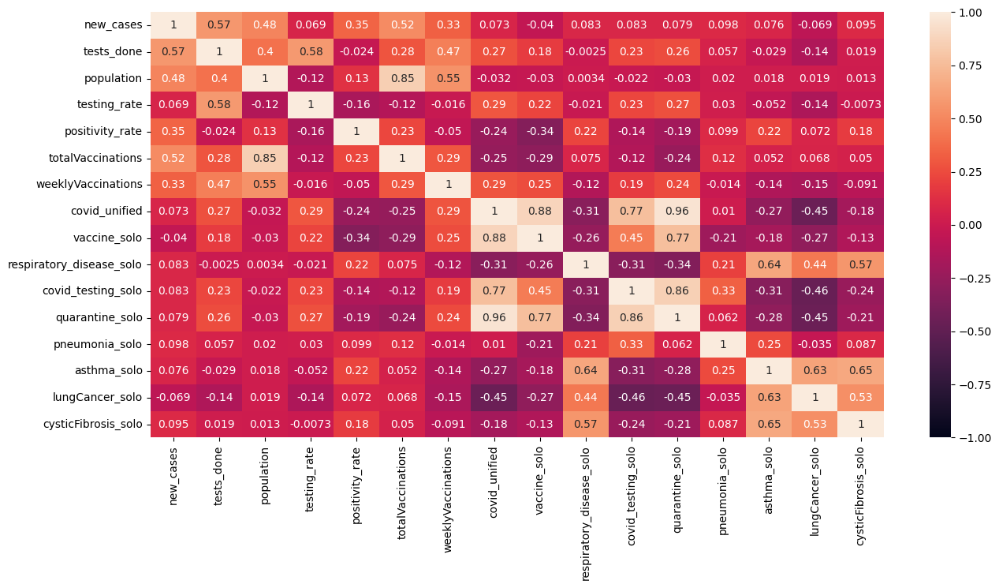

In [65]:
plt.figure(figsize=(15,7))
sns.heatmap(data=combinedEuropeVaccinationsTestingAndTrends.iloc[:,list(range(3, 19))].corr(), annot=True, vmin=-1, vmax=1)

* Nie obserwujemy żadnej sensownej korelacji między danymi o przypadkach i danych o szczepionkach w Europie wraz z danymi o wyszukiwaniach. Może to być pośrednio spowodowane tym, że dane o wyszukiwaniach były dostępne jedynie dla całego świata.
* Co ciekawe, w okresie dostępności szczepionek zmieniły się korelacje między wyszukiwaniami
* Widzimy niemal idealną korelację między liczbą wyszukiwań informacji o kwarantannie oraz o covidzie. Im więcej było wyszukiwań covida tym więcej ludzi pragnęło zasięgnąć informacji o kwarantannie
* Podobnie ze szczepionkami. Im bardziej rosła liczba wyszukiwań frazy "covid" tym bardziej rosła liczba wyszukiwań frazy "vaccine", choć nie była ona już taka duża jak w poprzednia
* Bardzo podobna korelacja jest między wyszukiwaniami informacji o kwarantannie jak i o testach
* Wysoka korelacja występuje również między vaccine, a quarantine - 0.77. Gdy dziedzina czasu była rozciągnięta do calego okresu ta korelacja była bardzo bliska zera!
* rak płuc ma korelację ujemną (na poziomie -0.45) z covidem, kwarantanną oraz z testami na covid. Nie jest to jednak na tyle duża korelacja, aby wyciągać daleko idące wnioski. Można przypuszczać, że im częściej ludzie wyszukiwali covid tym mniej przypuszczali, że może to być rak płuca
* w okresie dostępności szczepionek korelacja między astmą a kwarantanną i zapaleniem płuc drastycznie zmalała
* Reszta korelacji nie zmieniła się znacząco

## Połączenie globalCasesAndVaccinations z Trends

In [66]:
combinedGlobalCasesVaccinationsAndTrends = pd.merge(globalCasesAndVaccinations, trends.loc[:,trendsSoloAttributes], how ='inner', left_on = "date", right_index=True)
combinedGlobalCasesVaccinationsAndTrends = combinedGlobalCasesVaccinationsAndTrends.sort_index()
combinedGlobalCasesVaccinationsAndTrends

,date,Country,Country_code,iso_code,WHO_region,New_cases,Cumulative_cases,New_deaths,Cumulative_deaths,totalVaccinations,weeklyVaccinations,covid_unified,vaccine_solo,respiratory_disease_solo,covid_testing_solo,quarantine_solo,pneumonia_solo,asthma_solo,lungCancer_solo,cysticFibrosis_solo
0,2021-02-22,Afghanistan,AF,AFG,EMRO,110,55714,11,2443,8200.0,1367.0,57.0,87,33,13.0,9,24,32,41,58
1,2021-03-15,Afghanistan,AF,AFG,EMRO,118,56103,6,2463,54000.0,2862.0,64.0,87,31,13.0,10,27,31,40,54
2,2021-04-05,Afghanistan,AF,AFG,EMRO,484,57160,24,2521,120000.0,3000.0,62.0,82,30,13.0,10,31,33,41,49
3,2021-04-19,Afghanistan,AF,AFG,EMRO,1050,58843,43,2582,240000.0,8000.0,72.0,92,33,12.0,9,35,33,39,52
4,2021-05-10,Afghanistan,AF,AFG,EMRO,1642,63484,56,2742,504502.0,13921.0,60.0,76,31,9.0,8,29,31,43,46
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13664,2022-08-22,Zimbabwe,ZW,ZWE,AFRO,75,256699,1,5593,12145591.0,18468.0,11.0,9,34,3.0,3,30,29,38,42
13665,2022-09-05,Zimbabwe,ZW,ZWE,AFRO,115,256870,0,5596,12161598.0,1334.0,11.0,10,49,2.0,3,31,32,42,49
13666,2022-09-19,Zimbabwe,ZW,ZWE,AFRO,344,257340,1,5599,12187779.0,6949.0,10.0,10,36,2.0,2,32,32,40,50
13667,2022-09-26,Zimbabwe,ZW,ZWE,AFRO,177,257517,3,5602,12214870.0,20360.0,11.0,9,32,2.0,2,31,32,40,50


Pokażemy poziom zmienności daty dla ramki combinedGlobalCasesVaccinationsAndTrends

In [67]:
print("Zakres dat dla ramki combinedGlobalCasesVaccinationsAndTrends")
print("Data początkowa: {0}".format(combinedGlobalCasesVaccinationsAndTrends.loc[:,"date"].min()))
print("Data końcowa: {0}".format(combinedGlobalCasesVaccinationsAndTrends.loc[:,"date"].max()))

Zakres dat dla ramki combinedGlobalCasesVaccinationsAndTrends
Data początkowa: 2020-11-30 00:00:00
Data końcowa: 2023-12-25 00:00:00


<Axes: >

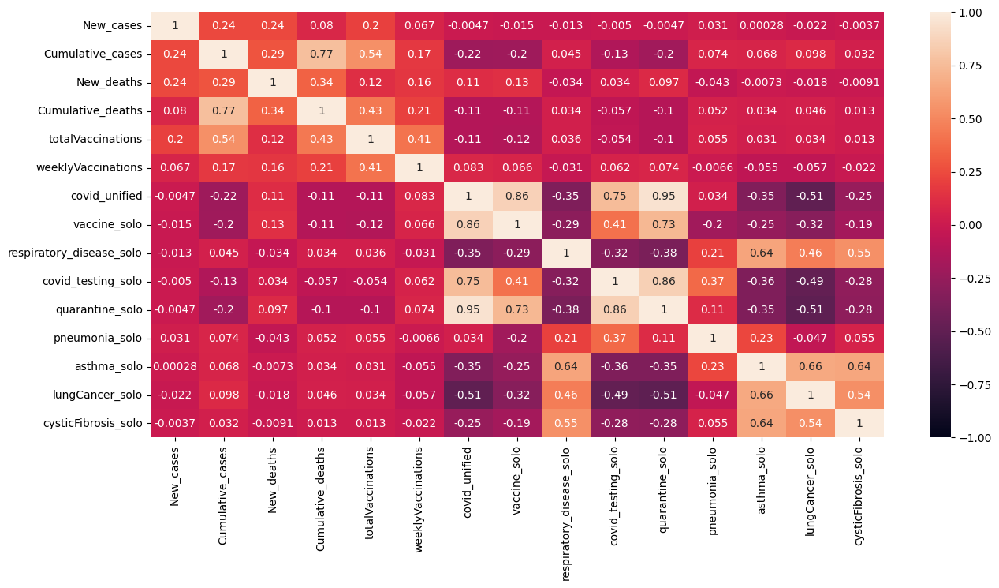

In [68]:
plt.figure(figsize=(15,7))
sns.heatmap(data=combinedGlobalCasesVaccinationsAndTrends.iloc[:,list(range(5, 20))].corr(), annot=True, vmin=-1, vmax=1)

* Również tutaj nie można wyciągnąć żadnych wniosków odnośnie korelacji wyszukiwań wraz z liczbą przypadków lub szczepionek
* Jedyne co można potwierdzić to to, że korelacje covid-quarantine, covid-vaccine, covid_testing-quarantine, vaccine-quarantine znacząco rosną jeśli dziedzina czasu zostanie ograniczona do okresu, w którym szczepionki były dostępne

Przeanalizujemy korelację zależnie od regionu

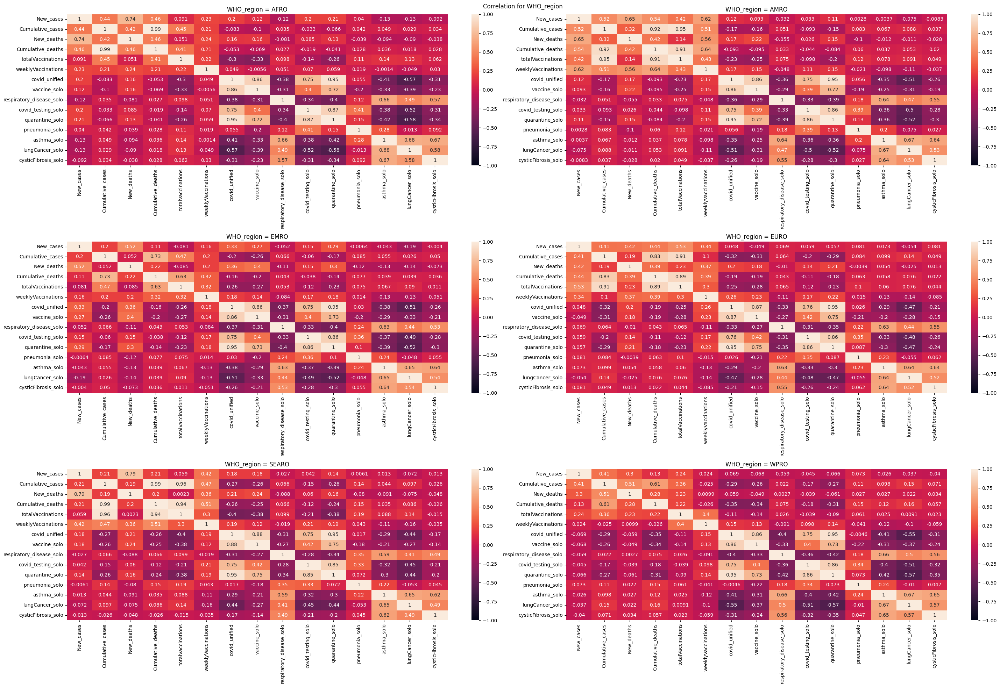

In [69]:
columns = combinedGlobalCasesVaccinationsAndTrends.columns
columns = columns[5:20]
analyseCorrelationInCategories(combinedGlobalCasesVaccinationsAndTrends, columns, "WHO_region")

* Korelacje między wyszukiwaniami nie zmieniają się znacząco jeśli brany jest pod uwagę region
* Co ciekawe, nie obserwujemy również żadnej sensownej korelacji między wyszukiwaniami, a liczbą przypadków, ani szczepionkami.
* Najwyższa korelacja dodatnia jaką możemy zaobserwować między wyszukiwaniami, a przypadkami i szczepionkami to 0.4 pomiędzy nowymi zgonami, a wyszukiwaniem szczepionek w regionie EMRO
* Najwyższa korelacja ujemna znajduje się pomiędzy "totalVaccinations" oraz wyszukiwaniami "covid" w regionie SEARO.
* Obie z powyższych są jednak zbyt niskie, żeby móc z tego wyciągać daleko idące wnioski.

## Analiza sumy przypadków, testów oraz szczepień we wszystkich krajach wraz z wyszukiwaniami
### Ramka covidCasesSumAndTrends - new cases oraz new deaths z ramki globalCases

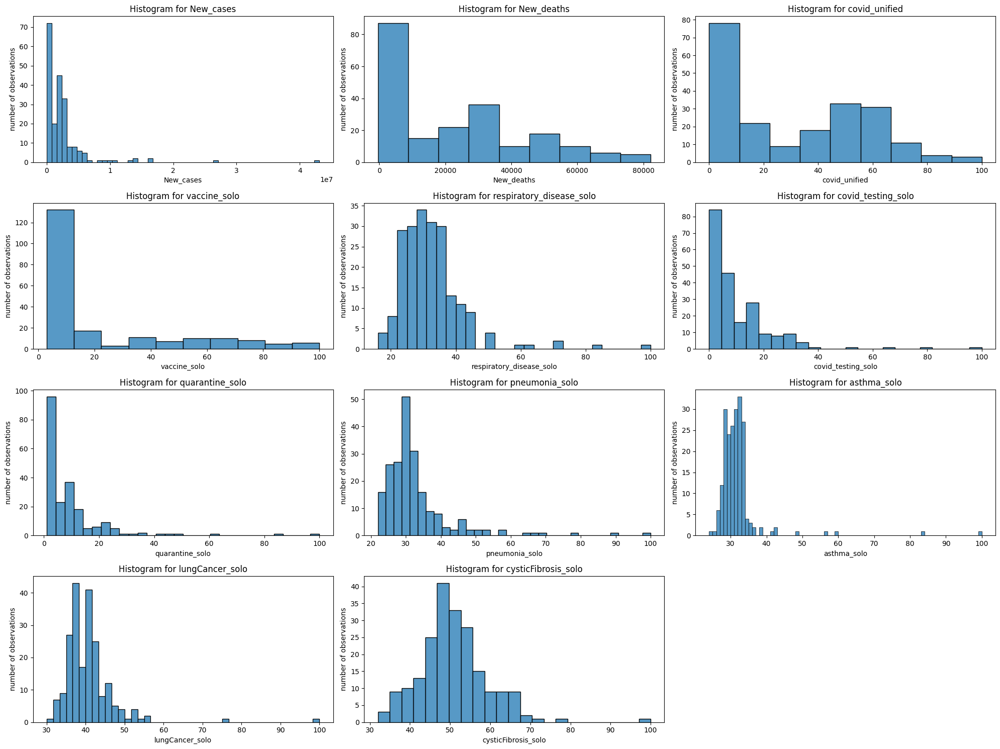

In [70]:
displayHistograms(covidCasesSumAndTrends)

* Łącznie nowych przypadków tygodniowo najczęściej było mniej niż 800 tysięcy, większe wartości zdarzały się sporadycznie
* Najczęstsza liczba nowych zgonów jest w przedziale 0-100000

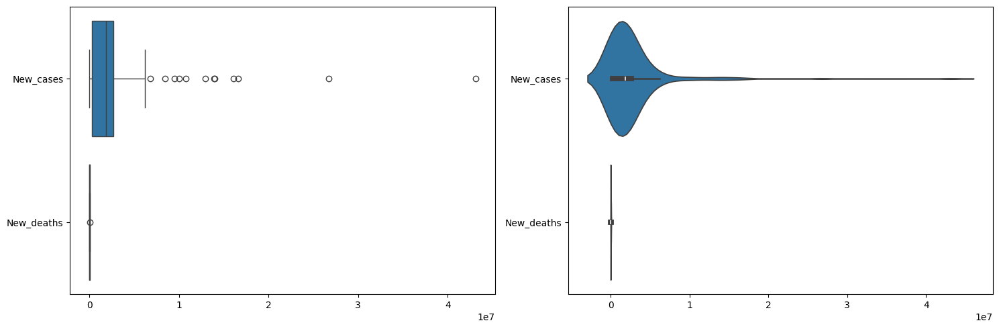

In [71]:
displayVariabilityPlotsWithoutClasses(covidCasesSumAndTrends, ["New_cases", "New_deaths"])

* Jest znacznie więcej nowych przypadków niż nowych śmierci

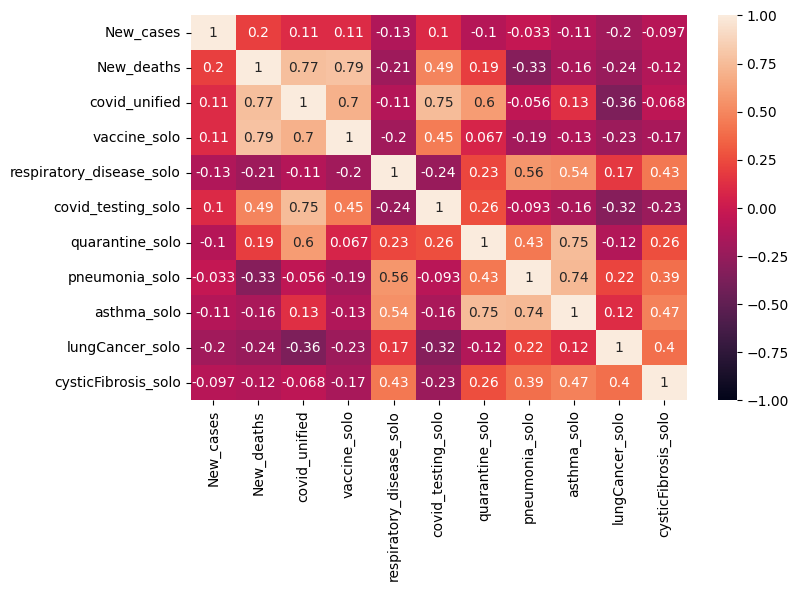

In [72]:
displayCorrelation(covidCasesSumAndTrends, covidCasesSumAndTrends.columns)

* Co interesujące, gdy zsumowaliśmy nowe przypadki i nowe śmierci dla wszystkich krajów w danej dacie, możemy zauważyć, że wraz ze wzrostem liczby nowych śmierci w ciągu tygodnia wzrasta liczba wyszukiwań fraz "covid" oraz "vaccine". Można przypuszczać, że wzrost liczby zgonów wpływa na wzrost zainteresowania zaszczepieniem się.  
  
Wyświetlimy również dane na osi czasu

In [73]:
plot1Trends = ['covid_unified', 'vaccine_solo', 'respiratory_disease_solo', 'covid_testing_solo','quarantine_solo']
plot2Trends = ['covid_unified', 'pneumonia_solo', 'asthma_solo', 'lungCancer_solo', 'cysticFibrosis_solo']

## displayLineplotForTwoYScales
- wyświetla wykres liniowy zawierające dwie osie Y.
- na lewej osi Y są wyświetlane atrybuty zawarte w leftYAttribs
- na prawej osi Y są wyświetlane atrybuty zawarte w rightYAttribs
- funkcja przyjmuje ramkę jako parametr frame

In [74]:
def displayLineplotForTwoYScales(frame, leftYAttribs, rightYAttribs):
    plt.figure(figsize=(15,5))
    sns.lineplot(data=frame.loc[:,leftYAttribs], palette=sns.color_palette("rocket"))
    plt.legend(bbox_to_anchor=(-0.15, 1), loc='upper left', borderaxespad=0)
    ax2 = plt.twinx()
    sns.lineplot(data=frame.loc[:,rightYAttribs], palette="bright")
    plt.legend(bbox_to_anchor=(1.03, 1), loc='upper left', borderaxespad=0)

C:\Users\Marta\AppData\Local\Temp\ipykernel_22336\2382313805.py:3: UserWarning: The palette list has more values (6) than needed (1), which may not be intended.
  sns.lineplot(data=frame.loc[:,leftYAttribs], palette=sns.color_palette("rocket"))


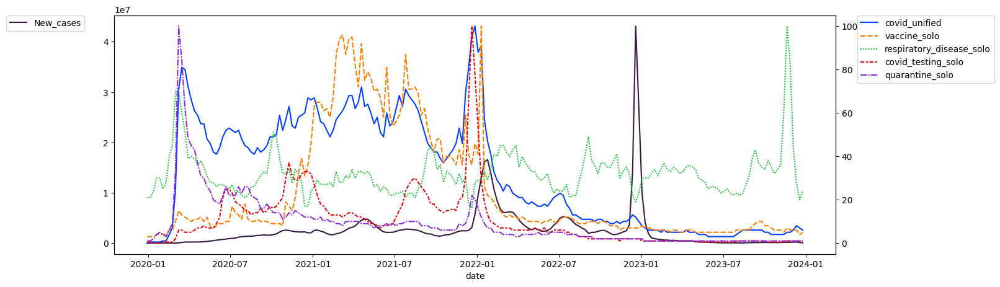

In [75]:
displayLineplotForTwoYScales(covidCasesSumAndTrends, ["New_cases"], plot1Trends)

* Liczba zarejestrowanych nowych przypadków w styczniu 2023 była ogromna, liczba wyszukiwań frazy "covid" lekko wzrosła, natomiast nie wpłynęło to na częstość wyszukiwań pozostałych fraz
* w styczniu 2022 gwałtownie rośnie liczba nowych przypadków oraz liczba wyszukiwań frazy covid, covid testing, vaccine, quarantine. W lutym tego samego roku gwałtownie spada. Może być to powiązane z wybuchem wojny na Ukrainie, społeczeństwo przestało się interesować Covidem w związku z tym wydarzeniem i tak zostało od tamtej pory

C:\Users\Marta\AppData\Local\Temp\ipykernel_22336\2382313805.py:3: UserWarning: The palette list has more values (6) than needed (1), which may not be intended.
  sns.lineplot(data=frame.loc[:,leftYAttribs], palette=sns.color_palette("rocket"))


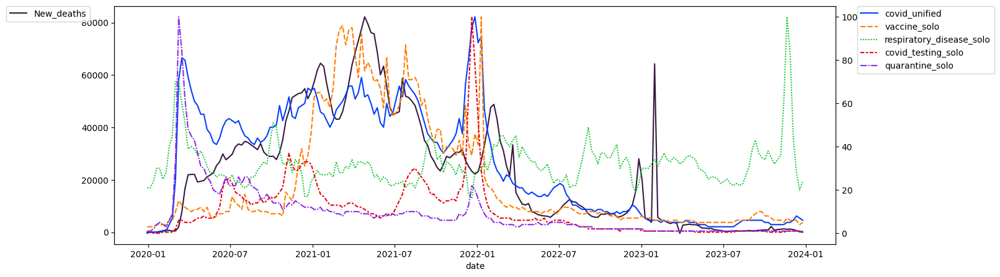

In [76]:
displayLineplotForTwoYScales(covidCasesSumAndTrends, ["New_deaths"], plot1Trends)

* Około stycznia 2022 wszystkie wyszukiwania zaczęły rosnąć
* Szczyt śmiertelności był około maja 2021, wtedy społeczeństwo zaczęło bardziej interesować się szczepionkami. Około marca 2021 nastąpił gwałtowny wzrost wyszukiwań frazy "vaccine", a następnie gwałtownie rośnie liczba śmierci. 
* Linie śmierci, wyszukiwań covid oraz vaccine zmieniają się podobnie

C:\Users\Marta\AppData\Local\Temp\ipykernel_22336\2382313805.py:3: UserWarning: The palette list has more values (6) than needed (1), which may not be intended.
  sns.lineplot(data=frame.loc[:,leftYAttribs], palette=sns.color_palette("rocket"))


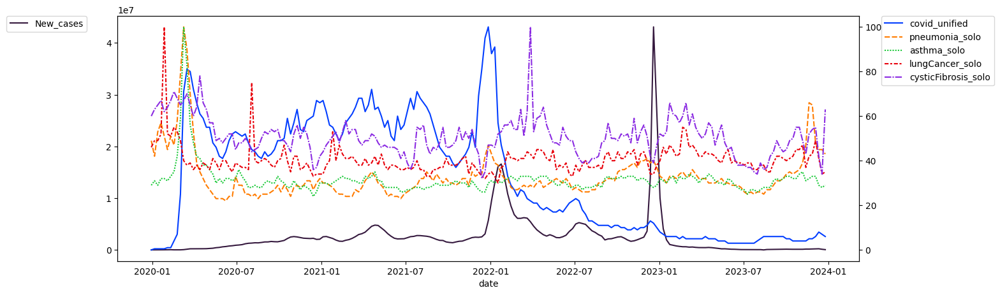

In [77]:
displayLineplotForTwoYScales(covidCasesSumAndTrends, ["New_cases"], plot2Trends)

* na początku covida gwałtownie wzrosła liczba wyszukiwań fraz pneumonia, asthma, lung cancer. Mogło być to związane z brakiem świadomości społecznej o koronawirusie
* około kwietnia 2022 gwałtownie wzrosła liczba wyszukiwań "cystic fibrosis"
* pneumonia, asthma, lung cancer, cystic fibrosis nie są związane z wyszukiwaniami covidu oraz new cases

C:\Users\Marta\AppData\Local\Temp\ipykernel_22336\2382313805.py:3: UserWarning: The palette list has more values (6) than needed (1), which may not be intended.
  sns.lineplot(data=frame.loc[:,leftYAttribs], palette=sns.color_palette("rocket"))


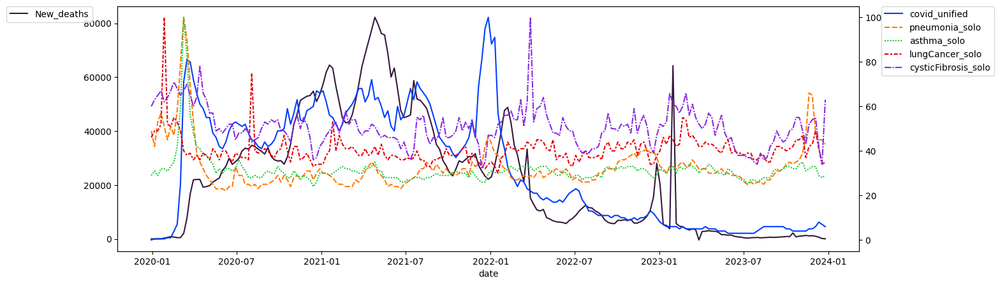

In [78]:
displayLineplotForTwoYScales(covidCasesSumAndTrends, ["New_deaths"], plot2Trends)

* na początku pandemii gwałtownie wzrosła liczba wyszukiwań covid, a z przesunięciem czasowym gwałtownie wzrosła liczba zgonów
* wraz z biegiem czasu liczba nowych zgonów nie zależała od częstości wyszukiwań pneumonia, asthma, lung cancer, cystic fibrosis

### Ramka covidTestingSumAndTrends - new cases oraz tests done z ramki covidTesting (dane europejskie)

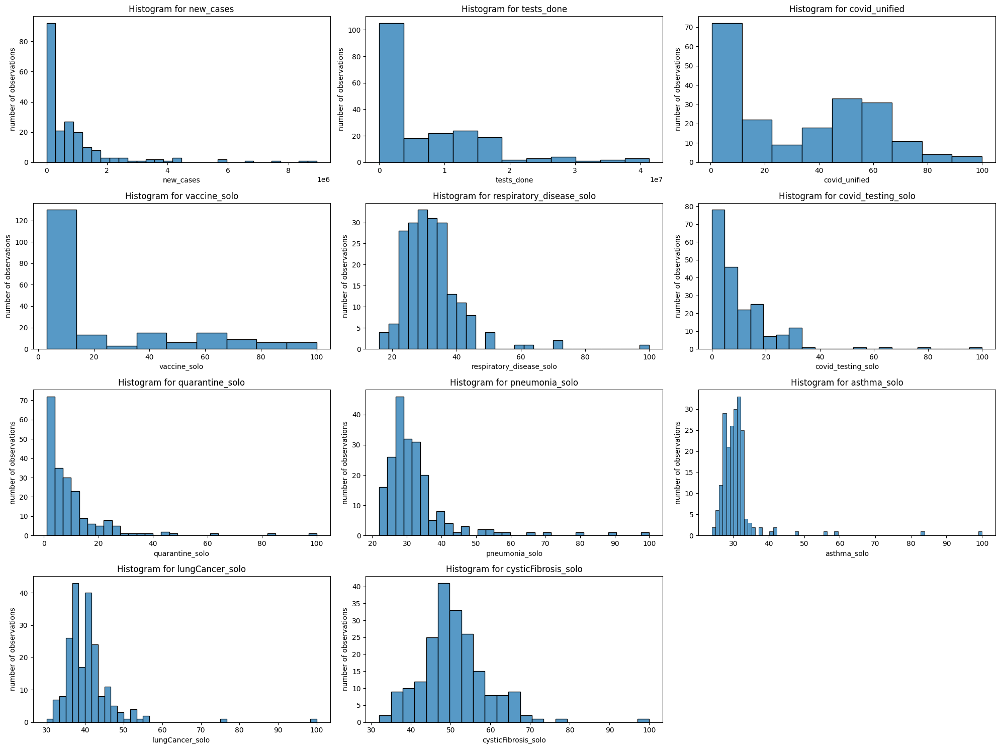

In [79]:
displayHistograms(covidTestingSumAndTrends)

* najczęściej występuje stosunkowo mała liczba nowych przypadków oraz stosunkowo mała liczba testów

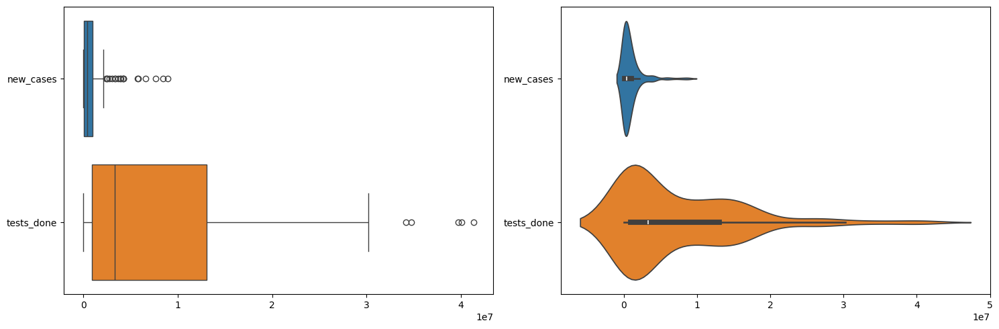

In [81]:
displayVariabilityPlotsWithoutClasses(covidTestingSumAndTrends, ["new_cases", "tests_done"])

* zmienność tests_done jest zdecydowanie większa niż liczba przypadków. Jest to logiczne ze względu na to, że nie każdy test jest pozytywny

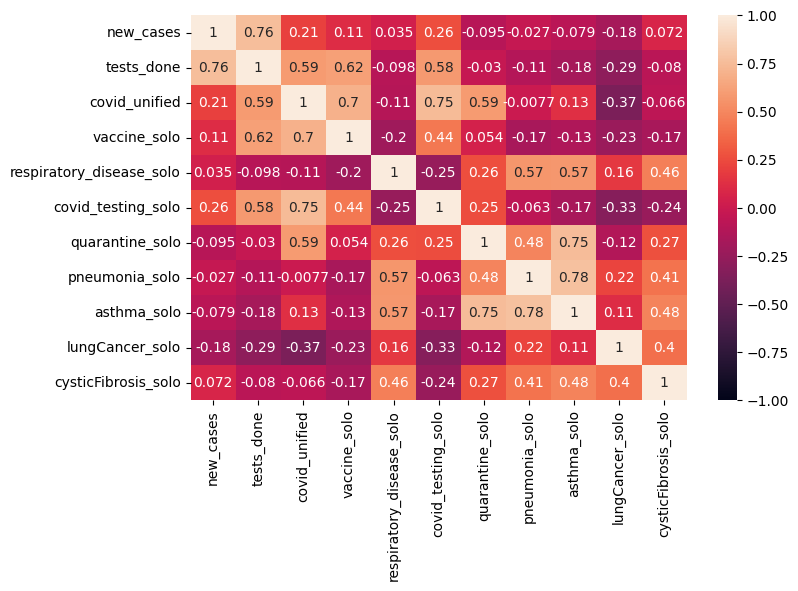

In [82]:
displayCorrelation(covidTestingSumAndTrends, covidTestingSumAndTrends.columns)

* Po zsumowaniu liczby testów w danej dacie możemy zaobserwować, że liczba testów jest skorelowana na poziomie około 0.6 z wyszukiwaniami covid, vaccine oraz covid_testing. Im więcej testów było robionych, tym częściej społeczeństwo szukało informacji o testach na covid

C:\Users\Marta\AppData\Local\Temp\ipykernel_22336\2382313805.py:3: UserWarning: The palette list has more values (6) than needed (1), which may not be intended.
  sns.lineplot(data=frame.loc[:,leftYAttribs], palette=sns.color_palette("rocket"))


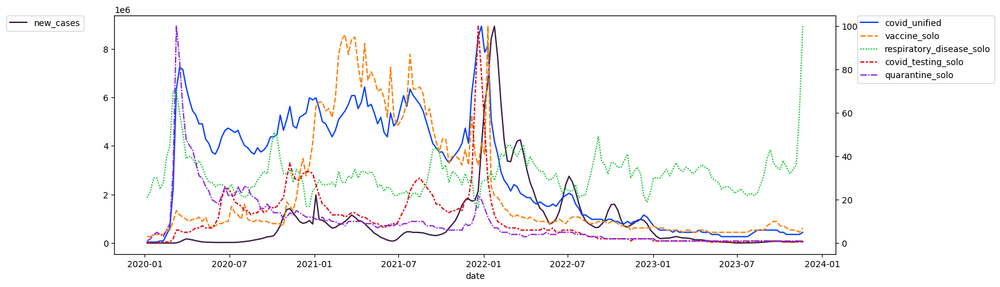

In [84]:
displayLineplotForTwoYScales(covidTestingSumAndTrends, ["new_cases"], plot1Trends)

* podczas szczytu wyszukiwan covid, vaccine, covid testing, był też szczyt nowych przypadków. Jest to związane z tym, że było częstsze wyszukiwanie covid gdy była większa liczba nowych przypadków
* następnie malała zarówno liczba nowych przypadków jak i częstość wyszukiwania fraz

C:\Users\Marta\AppData\Local\Temp\ipykernel_22336\2382313805.py:3: UserWarning: The palette list has more values (6) than needed (1), which may not be intended.
  sns.lineplot(data=frame.loc[:,leftYAttribs], palette=sns.color_palette("rocket"))


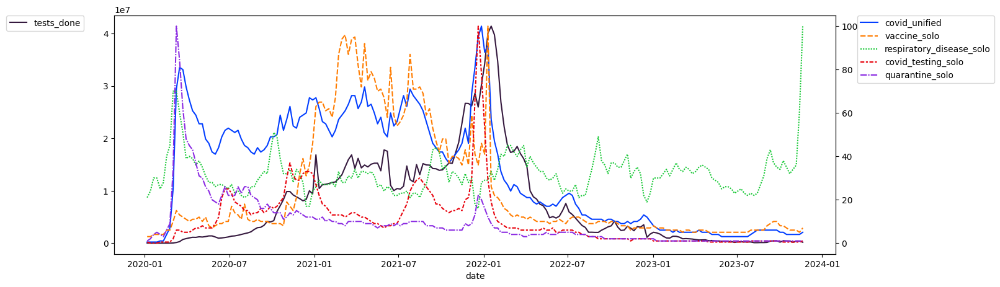

In [87]:
displayLineplotForTwoYScales(covidTestingSumAndTrends, ["tests_done"], plot1Trends)

* podczas szczytu wyszukiwan covid, vaccine, covid testing, był też szczyt wykonanych testów. Jest to związane z tym, że częstsze wyszukiwanie covid wpływało na częstsze robienie testów
* następnie malała zarówno liczba wykonanych testów jak i częstość wyszukiwania fraz
* krzywa zrobionych testów oraz covid zmieniają się w podobny sposób

C:\Users\Marta\AppData\Local\Temp\ipykernel_22336\2382313805.py:3: UserWarning: The palette list has more values (6) than needed (1), which may not be intended.
  sns.lineplot(data=frame.loc[:,leftYAttribs], palette=sns.color_palette("rocket"))


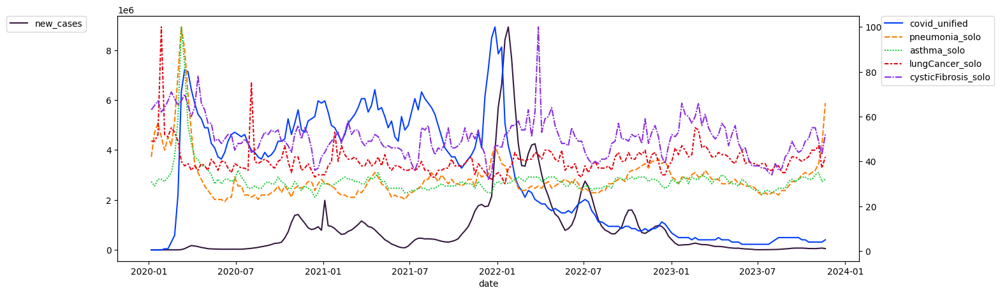

In [88]:
displayLineplotForTwoYScales(covidTestingSumAndTrends, ["new_cases"], plot2Trends)

* po osiągnięciu peaku nowych przypadków i wyszukiwań covid, obie krzywe zaczęły maleć i się wypłaszczać
* wyszukiwania pozostałych fraz utrzymują się w przybliżeniu na stałym poziomie i nie zależą od zmian w nowych przypadkach i wyszukiwań covid

C:\Users\Marta\AppData\Local\Temp\ipykernel_22336\2382313805.py:3: UserWarning: The palette list has more values (6) than needed (1), which may not be intended.
  sns.lineplot(data=frame.loc[:,leftYAttribs], palette=sns.color_palette("rocket"))


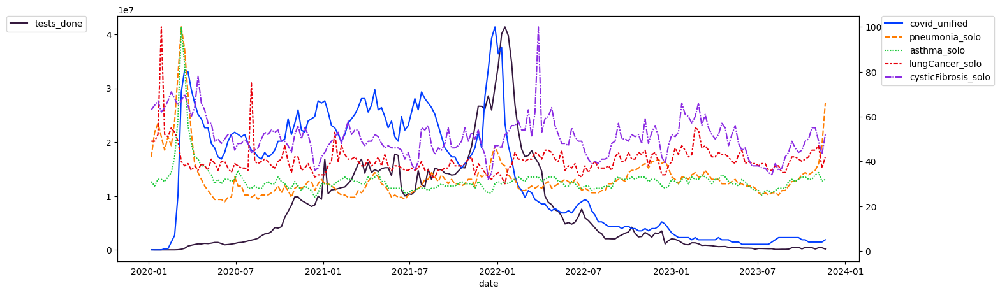

In [89]:
displayLineplotForTwoYScales(covidTestingSumAndTrends, ["tests_done"], plot2Trends)

* po osiągnięciu peaku zrobionych testów i wyszukiwań covid, obie krzywe zaczęły maleć i się wypłaszczać
* wyszukiwania pozostałych fraz utrzymują się w przybliżeniu na stałym poziomie i nie zależą od zmian w wykonanych testach i wyszukiwaniach covid

### Ramka vaccinationsSumAndTrends - totalVaccinations oraz weeklyVaccinations

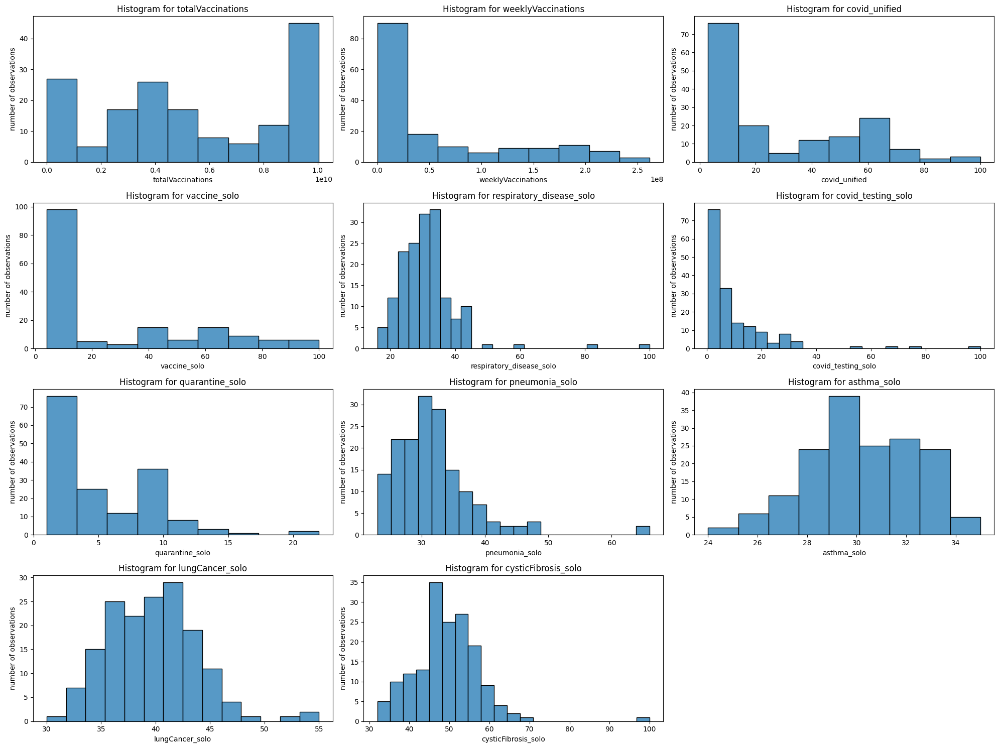

In [90]:
displayHistograms(vaccinationsSumAndTrends)

* totalVaccinations miało bardzo dużą liczbę obserwacji gdy łączna liczba szczepień była wysoka. Oznacza to, że po tym jak większość osób już się zaszczepiła to stały one na stałym poziomie
* Najwięcej obserwacji jest gdy weeklyVaccinations było mało. Inne wartości mają rozkład mniej więcej jednostajny

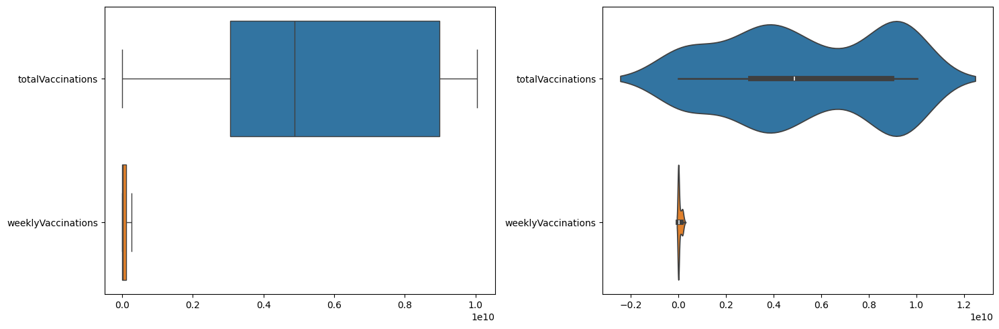

In [91]:
displayVariabilityPlotsWithoutClasses(vaccinationsSumAndTrends, ["totalVaccinations", "weeklyVaccinations"])

* totalVaccinations ma zdecydowanie większy poziom zmienności co jest logiczne
* Nie ma żadnych obserwacji odstających w weeklyVaccinations. Oznacza to, że nie było żadnego tygodnia, w którym byłaby zdecydowanie większa liczba szczepień

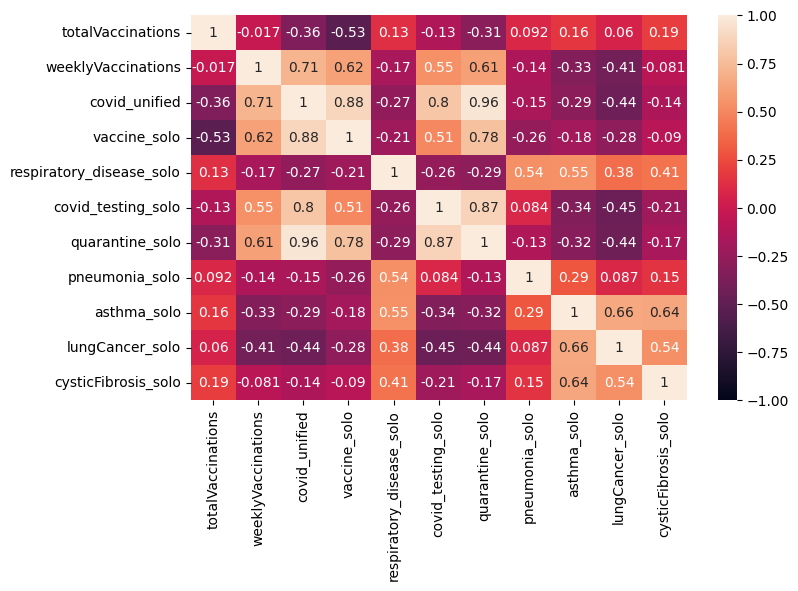

In [92]:
displayCorrelation(vaccinationsSumAndTrends, vaccinationsSumAndTrends.columns)

* weeklyVaccinations są skorelowane z wyszukiwaniami covid (0.7) oraz z vaccine, covid_testing i quarantine (0.6). Wyszukiwania tych fraz przyczyniały się do większej liczby szczepień
* ujemna korelacja (-0.53) pomiędzy totalVaccinations, a wyszukiwaniami vaccine może oznaczać, że jak ludzie się już zaszczepili to nie szukali potem informacji o szczepionkach

C:\Users\Marta\AppData\Local\Temp\ipykernel_22336\2382313805.py:3: UserWarning: The palette list has more values (6) than needed (1), which may not be intended.
  sns.lineplot(data=frame.loc[:,leftYAttribs], palette=sns.color_palette("rocket"))


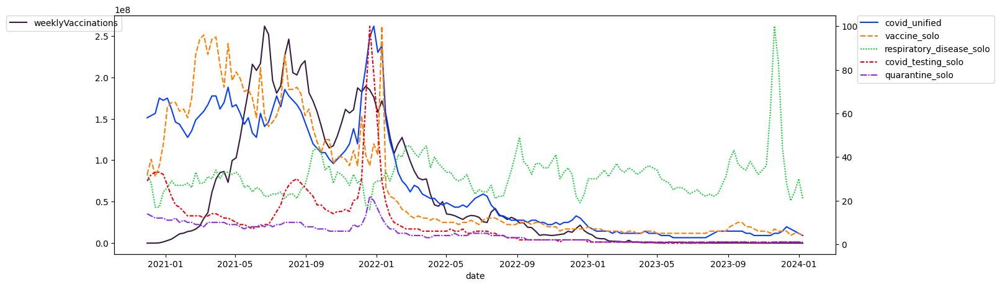

In [96]:
displayLineplotForTwoYScales(vaccinationsSumAndTrends, ["weeklyVaccinations"], plot1Trends)

* Po osiągnięciu szczytu wyszukiwań vaccine, covid testing, covid, quarantine wykresy wyszukiwań fraz oraz weeklyVaccinations zaczynają się wypłaszczać
* Po przekroczeniu maja 2021 krzywe vaccine, covid oraz weeklyVaccinations wyglądają podobnie

C:\Users\Marta\AppData\Local\Temp\ipykernel_22336\2382313805.py:3: UserWarning: The palette list has more values (6) than needed (1), which may not be intended.
  sns.lineplot(data=frame.loc[:,leftYAttribs], palette=sns.color_palette("rocket"))


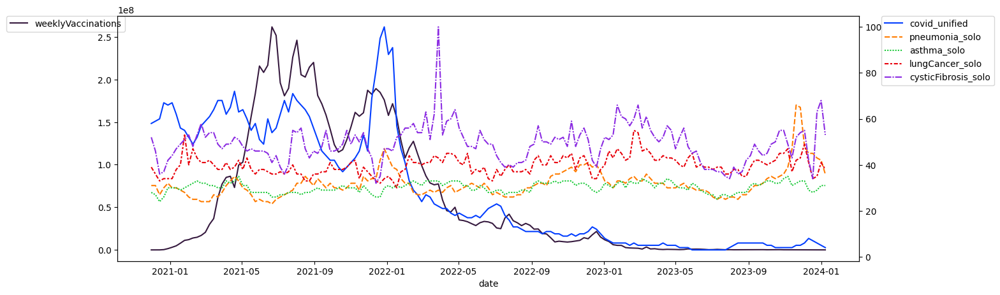

In [97]:
displayLineplotForTwoYScales(vaccinationsSumAndTrends, ["weeklyVaccinations"], plot2Trends)

* Choroby pneumonia, athma, lung cancer, cystic fibrosis nie są związane ze szczepieniami na covid. Utrzymują się one na stosunkowo stałym poziomie